#  Reproducing the figures from 'Investigating the impact of local manipulations on spontaneous and evoked brain complexity indices: A large-scale computational model' by Gaglioti G., Nieus T., Massimini M., & Sarasso S., (2024).

In this notebook, we will perform the analyses necessary to reproduce the main figures of the article.

In [1]:
from tvb.simulator.lab import *
import os
import numpy as np
import pylab as plt
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import statsmodels.stats
import scikit_posthocs as sp
import pandas as pd
from scipy.interpolate import splrep, splev
import seaborn as sns
import networkx as nx
from func_complexity import *
%matplotlib inline

In [2]:
path_base = os.getcwd()
path_outputs = os.path.join(path_base, 'data', 'outputs')

In [3]:
path_Dconn = os.path.join(path_base, 'data', 'connectivity', 'Dconn.zip' )
Dconn = connectivity.Connectivity.from_file(path_Dconn)
Dconn.configure()

path_Hconn = os.path.join(path_base, 'data', 'connectivity', 'Hconn.zip' )
Hconn = connectivity.Connectivity.from_file(path_Hconn)
Hconn.configure()

WARNING  File 'hemispheres' not found in ZIP.
WARNING  File 'average_orientations' not found in ZIP.
WARNING  File 'cortical' not found in ZIP.
WARNING  File 'hemispheres' not found in ZIP.


In [4]:
local_manipulations = np.array([[          ], # control condition
                                [14, 16, 15],
                                [17, 18, 27],
                                [30, 33, 31],
                                [36, 35, 5],
                                [ 6, 21,  2],
                                [ 3,  4,  5],
                                [12, 28, 25],
                                [15, 14,  4],
                                [19, 3, 20],
                                [ 0,  1, 29],
                                [ 2, 24,  6],
                                [ 9, 24, 34],
                                [22, 20, 19],
                                [23,  8, 27],
                                [32,  2, 21],
                                [ 3, 19, 18],
                                [11, 33, 29],
                                [28, 12, 16],
                                [18, 3, 17],
                                [34, 24, 31]], dtype='object')

In [5]:
def lin_fit(x_data, y_data, plot_it=False, ax=plt, verbose=False, color='r'):
    '''
    '''
    xFIT=np.array([x_data.min(), x_data.max()])
    x = sm.add_constant(x_data)
    mod = sm.OLS(y_data, x)
    res = mod.fit()
    slope = res.params[1]
    intercept = res.params[0]
    yFIT = slope * xFIT + intercept
    if plot_it:
        ax.plot(xFIT, yFIT, '-', color=color, lw=2, zorder=6)
    if verbose:    
        print("parameters: ",res.params)
        print("confidence levels: ",res.conf_int(0.05))
    return res

# Figure 2

The IFR_spontaneous dictionary, containing the spontaneous instantaneous firing rate of all examined conditions, is necessary to plot Figure 2.<br> Download the 'IFR_spontaneous.npy' dict at https://unimi2013-my.sharepoint.com/:f:/g/personal/gianluca_gaglioti_unimi_it/Emts0WKNp4JPqszO8tDhCpgBl3iUNQ-OYujYLHshoKkn4g?e=htjQfi and put it in the 'path_outputs' path ('.../data/outputs'). You can also run the simulations entirely with run_simulations.ipynb and save the result in the outputs folder ('.../data/outputs'). Alternatively, pre-calculated values for each variable are provided in the "path_outputs" directory.

In [91]:
IFR_spontaneous = np.load(os.path.join(path_outputs, 'IFR_spontaneous.npy'), allow_pickle=1).item()

## Figure 2a

In the following code block, we are calculating the MFR$\Delta$ for each local manipulation to assess the impact of local silencing on the model’s spontaneous activity. MFR$\Delta$ represents the difference in mean firing rate between the local manipulation condition and the control condition (excluding the manipulated nodes).

In [6]:
'''
MFRdelta_R, MFRdelta_L, MFRdelta_all  = [],[],[]
for n, lm in enumerate(local_manipulations[1:]):
    
    #Right Hem
    nodes = np.delete(np.arange(37),lm) # exclude manipulated nodes
    MFRctrl = np.mean(np.mean(IFR_spontaneous[f'control'][nodes,:],axis=0),axis=0)
    MFRlm = np.mean(np.mean(IFR_spontaneous[f'L{n+1}'][nodes,:],axis=0),axis=0)
    delta = (MFRlm-MFRctrl)
    MFRdelta_R.append(delta)  
    
    #Left hem
    nodes = np.arange(38,75)
    MFRctrl = np.mean(np.mean(IFR_spontaneous[f'control'][nodes,:],axis=0),axis=0)
    MFRlm = np.mean(np.mean(IFR_spontaneous[f'L{n+1}'][nodes,:],axis=0),axis=0)
    delta = (MFRlm-MFRctrl)
    MFRdelta_L.append(delta)
    
    #all
    nodes = np.delete(np.arange(75), 37)
    nodes = np.delete(nodes, lm) # exclude manipulated nodes
    MFRctrl = np.mean(np.mean(IFR_spontaneous[f'control'][nodes,:],axis=0),axis=0)
    MFRlm = np.mean(np.mean(IFR_spontaneous[f'L{n+1}'][nodes,:],axis=0),axis=0)
    delta = (MFRlm-MFRctrl)
    MFRdelta_all.append(delta)

MFRdelta_R = np.array(MFRdelta_R)
MFRdelta_L = np.array(MFRdelta_L)
MFRdelta_all = np.array(MFRdelta_all)
'''
# load precomputed values
MFRdelta_R = np.load(os.path.join(path_outputs, 'MFRdelta.npy'), allow_pickle=1)[0]
MFRdelta_L = np.load(os.path.join(path_outputs, 'MFRdelta.npy'), allow_pickle=1)[1]
MFRdelta_all = np.load(os.path.join(path_outputs, 'MFRdelta.npy'), allow_pickle=1)[2]

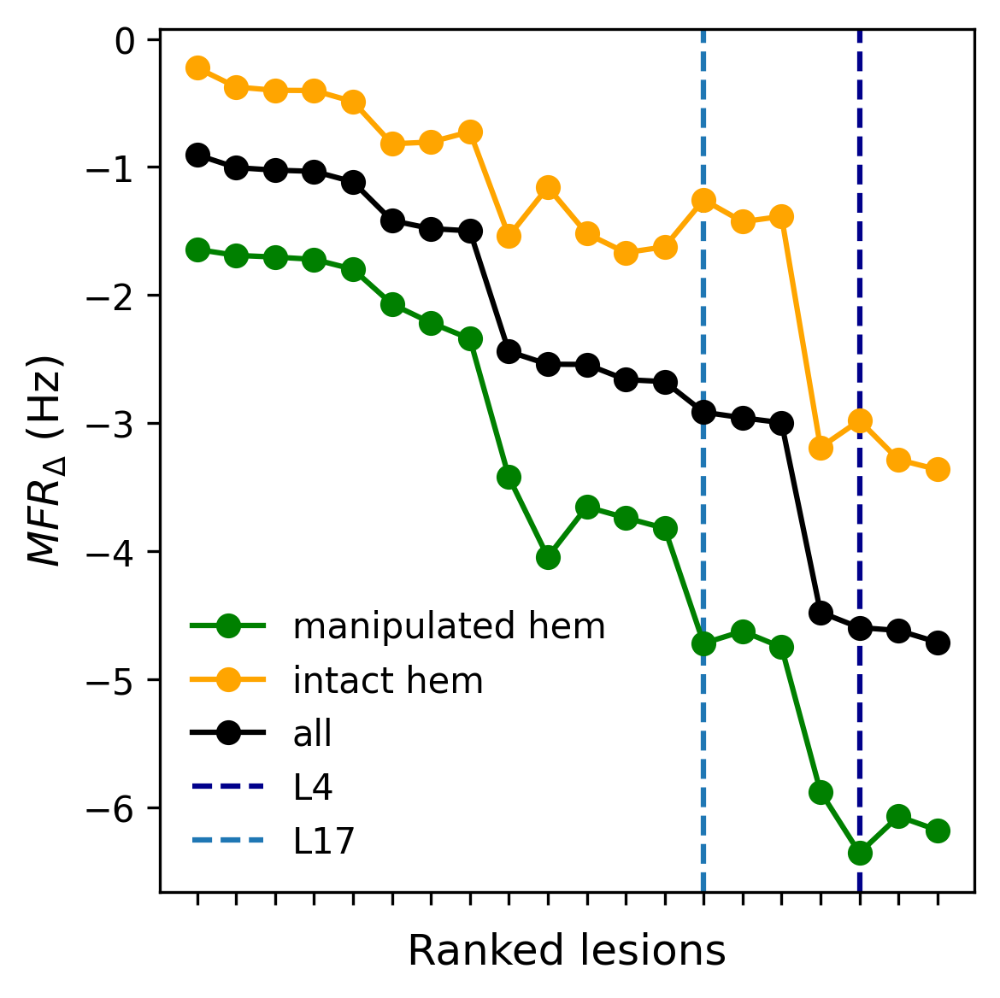

In [7]:
fig, ax = plt.subplots(dpi=300, figsize=(4,4))
idxs = np.argsort(MFRdelta_all)[::-1]
x = np.arange(20)
ax.plot(x, MFRdelta_R[idxs],'-o', color='green', label='manipulated hem', zorder=3)
ax.plot(x, MFRdelta_L[idxs],'-o', color='orange', label='intact hem', zorder=3)
ax.plot(x, MFRdelta_all[idxs],'-o', color='k', label='all', zorder=3)
ax.set_xticks(x)
ax.set_xticklabels([], rotation=50, fontsize=8)
ax.set_xlabel('Ranked lesions',fontsize=12)
ax.set_ylabel(r'$MFR_{\Delta}$ (Hz)',fontsize=12)
ax.axvline(np.where(idxs==4-1), ls='--', c='darkblue',label='L4') #-1; without control
ax.axvline(np.where(idxs==17-1), ls='--', c='tab:blue',label='L17')
plt.legend(loc='best', frameon=False);
plt.tight_layout()

## Figure 2b

We can quantify the impact of local node silencing on the complexity of spontaneous dynamics by computing Lempel-Ziv complexity (LZc) on the instantaneous firing rate (IFR) derived from the model timeseries. 
We can calculate LZc across conditions from the IFR_spontaneous dictionary. Alternatively, we can load the precalculated values from the outputs folder.

In [8]:
'''
LZc_values = []
step=39999
for n in range(21):
    key = 'control' if n == 0 else f'L{n}'
    data = IFR_spontaneous[key]
    LZtrial = []
    nodes = np.delete(np.arange(75),37) # remove the non-connected nodes
    nodes = np.delete(nodes,local_manipulations[n]) # remove manipulated nodes
    for t in np.arange(data.shape[1], step=step):
        DATAn = data[nodes,t:t+step]
        LZn = LZc(DATAn)
        LZtrial.append(LZn)
    LZc_values.append(LZtrial)
LZc_values = np.array(LZc_values)
'''
# load the precomputed LZc values
LZc_values = np.load(os.path.join(path_outputs, 'LZc_values.npy'), allow_pickle=True)

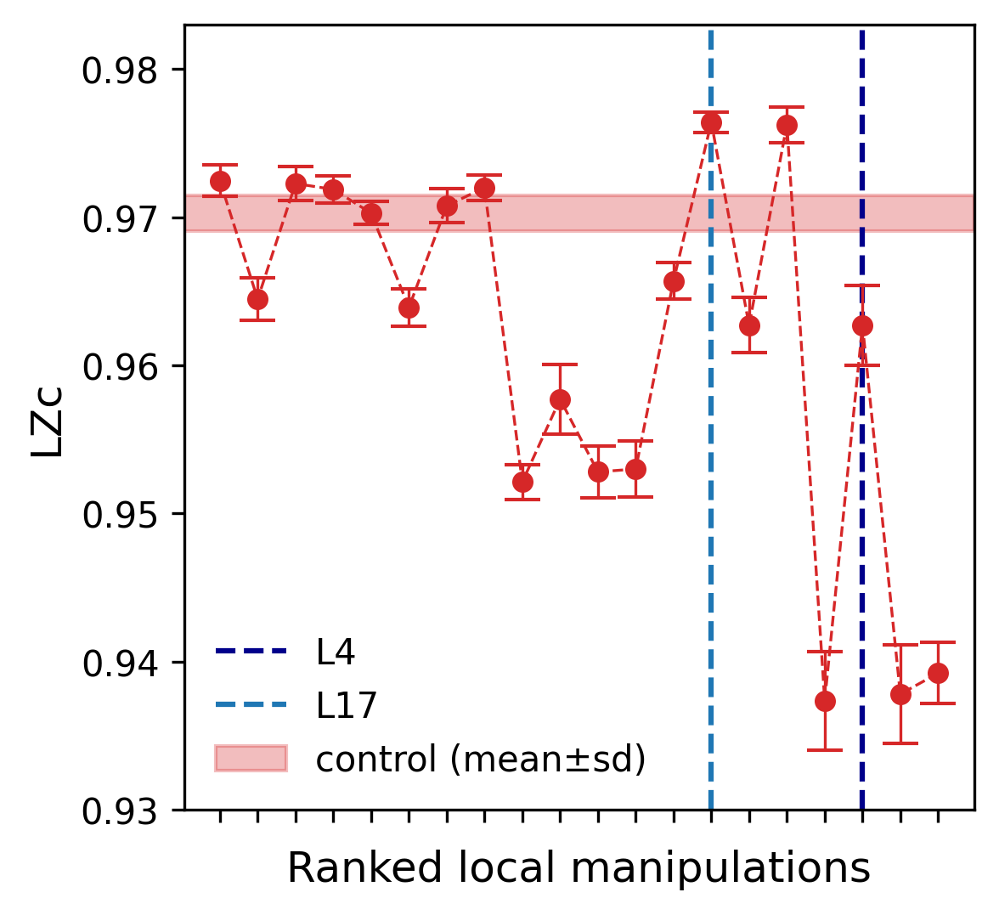

In [9]:
LZc_err=np.std(LZc_values,axis=1)[:]
LZc_mean=LZc_values.mean(axis=1)[:]

fig, ax = plt.subplots(dpi=300, figsize=(4,4), facecolor="None")
idxs = np.argsort(MFRdelta_all)[::-1]
x = np.arange(20)
ax.plot(x, LZc_mean[1:][idxs],'o', ms=5, color='tab:red',zorder=3)
ax.errorbar(x, LZc_mean[1:][idxs], ls='--', lw=0.8, yerr=LZc_err[1:][idxs], capsize=5,  color='tab:red',zorder=3)
ax.set_xticks(np.arange(20))
ax.set_xticks(x)
ax.set_xticklabels([], rotation=50, fontsize=8)
ax.set_xlabel('Ranked local manipulations',fontsize=12)
ax.set_ylabel(f'LZc',fontsize=12)
ax.set_yticks(ticks=np.arange(0.93, 0.99, step=0.01))
ax.set_ylim(top=0.983)
ax.axvline(np.where(idxs==4-1), ls='--', c='darkblue',label='L4') #-1; without control
ax.axvline(np.where(idxs==17-1), ls='--', c='tab:blue',label='L17')
ax.axhspan(LZc_mean[0]-LZc_err[0],LZc_mean[0]+LZc_err[0], color='tab:red',alpha=0.3, label='control (mean±sd)' )
plt.legend(loc='best', frameon=False);

In [10]:
stat = stats.kruskal(LZc_values[0],LZc_values[1],LZc_values[2],LZc_values[3],LZc_values[4],LZc_values[5],LZc_values[6],
            LZc_values[7],LZc_values[8],LZc_values[9],LZc_values[10],LZc_values[11],LZc_values[12],LZc_values[13],
            LZc_values[14],LZc_values[15],LZc_values[16],LZc_values[17],LZc_values[18],LZc_values[19],LZc_values[20])
print(stat)
pvals_LZc = sp.posthoc_dunn(LZc_values, p_adjust = 'fdr_bh')

pvals_LZc.index = [f'L{n}' if n > 0 else 'control' for n in range(len(local_manipulations))]
pvals_LZc.columns = [f'L{n}' if n > 0 else 'control' for n in range(len(local_manipulations))]

print(f"\np-values of Dunn post-hoc test:\n{pvals_LZc['control']}")

KruskalResult(statistic=200.74464454976305, pvalue=8.016028507125014e-32)

p-values of Dunn post-hoc test:
control    1.000000
L1         0.015101
L2         0.888890
L3         0.468384
L4         0.101022
L5         0.000029
L6         0.335289
L7         0.952004
L8         0.082843
L9         0.002027
L10        0.049205
L11        0.000022
L12        0.197063
L13        0.001279
L14        0.431584
L15        0.000045
L16        0.002373
L17        0.045548
L18        0.363796
L19        0.147500
L20        0.327419
Name: control, dtype: float64


## Figure 2c

We can correlate LZc with the global activity level, quantified as the mean firing rate (MFR) averaged across all network nodes (excluding manipulated nodes).

In [11]:
'''
MFR_R,MFR_L,MFR_all = [],[],[]
for n,lm in enumerate(local_manipulations[:]):
    key = 'control' if n == 0 else f'L{n}'

    #right
    nodes = np.delete(np.arange(37),lm)
    mfr = np.mean(np.mean(IFR_spontaneous[key][nodes,:],axis=0),axis=0)
    MFR_R.append(mfr)
    
    #left
    nodes = np.arange(38,75)
    mfr = np.mean(np.mean(IFR_spontaneous[key][nodes,:],axis=0),axis=0)
    MFR_L.append(mfr)    
    
    #all
    nodes = np.delete(np.arange(75), 37)
    nodes = np.delete(nodes, lm)
    mfr = np.mean(np.mean(IFR_spontaneous[key][nodes,:],axis=0),axis=0)
    MFR_all.append(mfr)   
    
MFR_R = np.array(MFR_R)
MFR_L = np.array(MFR_L)
MFR_all = np.array(MFR_all)
'''
# load precomputed values
MFR_R = np.load(os.path.join(path_outputs, 'MFR.npy'), allow_pickle=1)[0]
MFR_L = np.load(os.path.join(path_outputs, 'MFR.npy'), allow_pickle=1)[1]
MFR_all = np.load(os.path.join(path_outputs, 'MFR.npy'), allow_pickle=1)[2]

r=0.69, p=0.0005


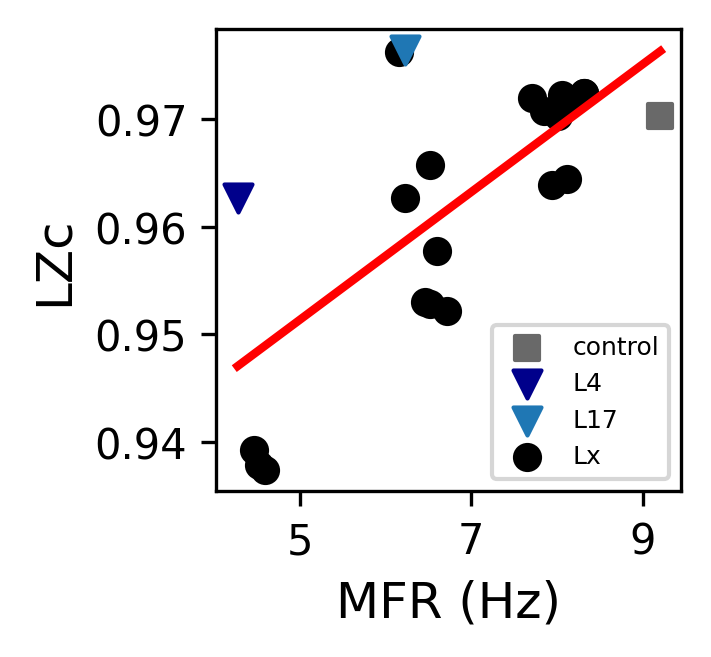

In [12]:
fig, ax = plt.subplots(dpi=300, figsize=(2,2),facecolor='None')

for e, p in enumerate(MFR_all):
    if e==17: 
        ax.scatter(p, LZc_values.mean(axis=1)[:][e], 
                marker='v',c='tab:blue', s=45, zorder=6,label='L17')
    elif e==0:
        ax.scatter(p, LZc_values.mean(axis=1)[0], 
                    marker='s',color='dimgrey',  s=35, zorder=6,label='control')
    elif e==4: 
        ax.scatter(p, LZc_values.mean(axis=1)[:][e], 
                marker='v', c='darkblue', s=45, zorder=6,label='L4')
    else:
        ax.scatter(p, LZc_values.mean(axis=1)[:][e], color='k', zorder=6,)

ax.scatter(MFR_all[-1],LZc_values.mean(axis=1)[-1], color='k', zorder=6, label='Lx')
xs,ys = MFR_all,LZc_values.mean(axis=1)
reg = lin_fit(xs, ys, plot_it=True )
ax.set_ylabel('LZc', fontsize=12)
ax.set_xticks([5,7,9])
ax.set_xlabel('MFR (Hz)',fontsize=12)
ax.legend(loc='best', fontsize=6);

r, p = stats.pearsonr(xs, ys)
print(f'r={np.around(r,2)}, p={np.around(p,4)}')

## Figure 2d

Similarly, we correlate LZc with the synchrony level of the network ($CC_{IFR}$), quantified as the average cross-correlation among all nodes (excluding manipulated nodes).

In [13]:
'''
CC_R, CC_L, CC_all = [],[],[]
for n, lm in enumerate(local_manipulations):
    key = 'control' if n == 0 else f'L{n}'
    
    #right
    nodes = np.delete(np.arange(37),lm)
    cc = np.corrcoef(IFR_spontaneous[key][nodes,:]).mean()
    CC_R.append(cc)
    
    #left
    nodes = np.arange(38,75)
    cc = np.corrcoef(IFR_spontaneous[key][nodes,:]).mean()
    CC_L.append(cc)    
    
    #all
    nodes = np.delete(np.arange(75), 37)
    nodes = np.delete(nodes, lm)
    cc = np.corrcoef(IFR_spontaneous[key][nodes,:]).mean()
    CC_all.append(cc)  
    
CC_R = np.array(CC_R)
CC_L = np.array(CC_L)
CC_all = np.array(CC_all)
'''
# load precomputed values
CC_R = np.load(os.path.join(path_outputs, 'CC_IFR.npy'), allow_pickle=1)[0]
CC_L = np.load(os.path.join(path_outputs, 'CC_IFR.npy'), allow_pickle=1)[1]
CC_all = np.load(os.path.join(path_outputs, 'CC_IFR.npy'), allow_pickle=1)[2]

r=-0.55, p=0.0094


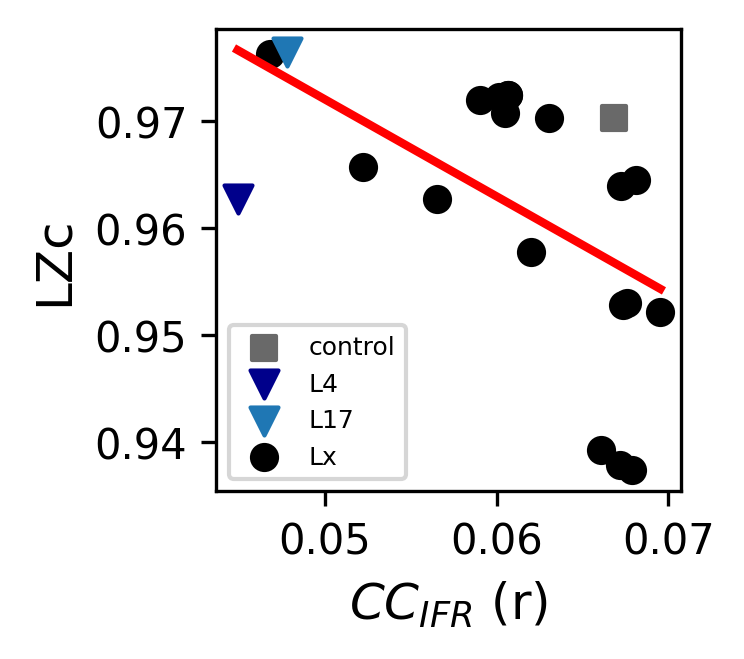

In [14]:
fig, ax = plt.subplots(dpi=300, figsize=(2,2),facecolor='None')

for e, p in enumerate(CC_all[:]):
    if e==17: 
        ax.scatter(p, LZc_values.mean(axis=1)[:][e], 
                marker='v',c='tab:blue', s=45, zorder=6,label='L17')
    elif e==0:
        ax.scatter(p, LZc_values.mean(axis=1)[0], 
                    marker='s',color='dimgrey',  s=35, zorder=6,label='control')
    elif e==4: 
        ax.scatter(p, LZc_values.mean(axis=1)[:][e], 
                marker='v', c='darkblue', s=45, zorder=6,label='L4')
    else:
        ax.scatter(p, LZc_values.mean(axis=1)[:][e], color='k', zorder=6,)

ax.scatter(CC_all[-1],LZc_values.mean(axis=1)[-1], color='k', zorder=6, label='Lx')
xs,ys=CC_all,LZc_values.mean(axis=1)
reg = lin_fit(xs, ys, plot_it=True )
ax.set_ylabel('LZc', fontsize=12)
ax.set_xlabel(r'$CC_{IFR}$ (r)',fontsize=12)
ax.legend(loc='best', fontsize=6);

r, p = stats.pearsonr(xs, ys)
print(f'r={np.around(r,2)}, p={np.around(p,4)}')

## Figure 2e

Next, we construct a multivariate linear model that describes LZc as a function of the global activity level (MFR) and synchrony level of the nework ($CC_{IFR}$).

In [15]:
columns=[ 'MFR', 'CC', 'LZ']
x=np.squeeze(np.dstack((MFR_all, CC_all, LZc_values.mean(axis=1)[:])))
df_mreg = pd.DataFrame(x, columns=columns)
model = smf.ols(formula=' LZ ~ MFR + CC', data=df_mreg).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     LZ   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     490.8
Date:                Sat, 13 Jan 2024   Prob (F-statistic):           1.99e-16
Time:                        17:33:33   Log-Likelihood:                 105.16
No. Observations:                  21   AIC:                            -204.3
Df Residuals:                      18   BIC:                            -201.2
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9856      0.003    288.455      0.000       0.978       0.993
MFR            0.0072      0.000     26.011      0.000       0.007       0.008
CC            -1.1917      0.053    -22.459      0.000      -1.303      -1.080
==============================================================================
Omnibus:                        8.303   Durbin-Watson:                   1.963
Prob(Omnibus):                  0.016   Jarque-Bera (JB):                5.829
Skew:                          -1.019   Prob(JB):                       0.0542
Kurtosis:                       4.583   Cond. No.                         976.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [16]:
x = df_mreg.iloc[:, 0]
y = df_mreg.iloc[:, 1]
z = df_mreg.iloc[:, 2]

x_surf, y_surf = np.meshgrid(np.linspace(x.min(), x.max(), 100),np.linspace(y.min(), y.max(), 100))
df_xy = pd.DataFrame({'MFR': x_surf.ravel(), 'CC': y_surf.ravel()})

fittedY = model.predict(exog=df_xy)
fittedY = np.array(fittedY)

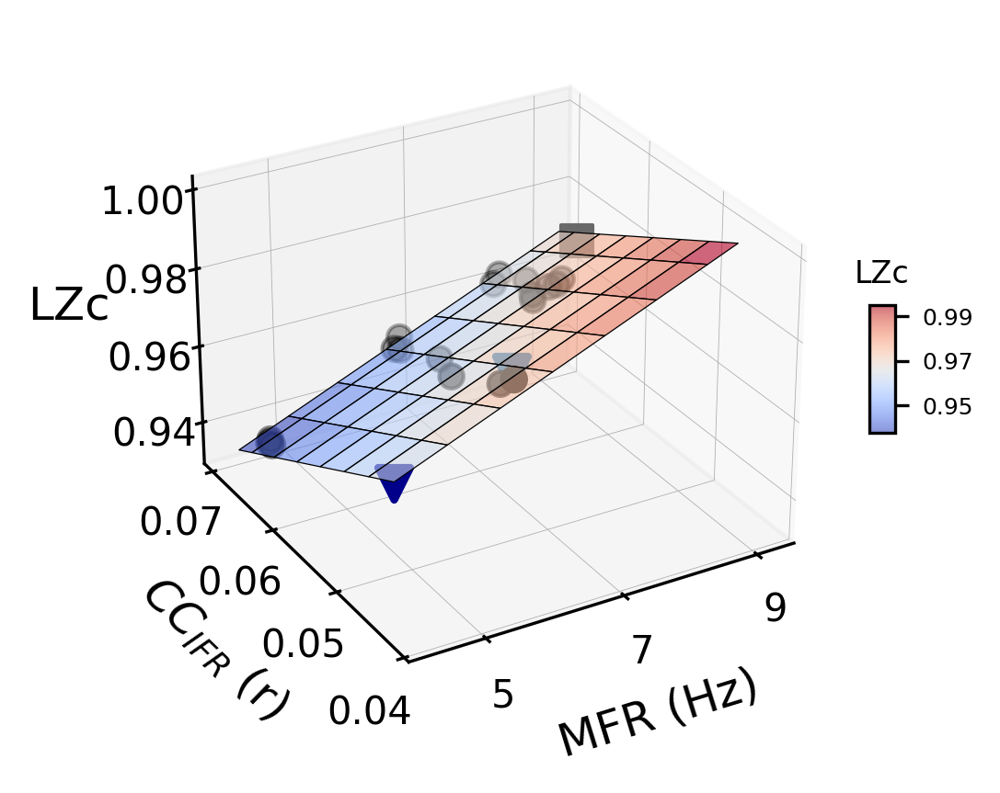

In [17]:
fig = plt.figure(dpi=300, figsize=(4,6), facecolor='None')

ax = fig.add_subplot(1, 1, 1, projection='3d', facecolor='None')

surf = ax.plot_surface(x_surf, y_surf,fittedY.reshape(x_surf.shape), cmap=cm.coolwarm,
                alpha=0.6,  rstride=15, cstride=15, edgecolors='k', lw=0.3)

cb = fig.colorbar(surf, ticks=[0.95,0.97,0.99], shrink=0.1, aspect=5,pad=0.05)
cb.ax.set_title('LZc', fontsize=8)
cb.ax.tick_params(labelsize=6)

idxs=np.delete(np.arange(21),[0,4,17])
ax.scatter(x[idxs], y[idxs],z[idxs], marker='o', c='k',zorder=3, s=40)
ax.scatter(x[0], y[0],z[0], marker='s', c='dimgrey', zorder=6, s=70)
ax.scatter(x[4], y[4],z[4], marker='v', color='darkblue', linewidth=2, zorder=3, s=70)
ax.scatter(x[17], y[17],z[17], marker='v', color='tab:blue', linewidth=2, zorder=3, s=70)

ax.set_xlabel(r'MFR (Hz)', fontsize =12,labelpad=0)
ax.set_ylabel(r'$CC_{IFR}$ (r)', fontsize=12,labelpad=0)
ax.set_zlabel('LZc', fontsize=12,labelpad=0)
ax.xaxis.set_tick_params(labelsize=10,pad=-1)
ax.yaxis.set_tick_params(labelsize=10,pad=0)
ax.zaxis.set_tick_params(labelsize=10,pad=0)
ax.set_xticks([5,7,9])
ax.set_yticks([0.04,0.05,0.06,0.07])
ax.set_zticks([0.94,0.96,0.98,1.]);

ax.azim = -120
ax.dist = 10
ax.elev = 28

ax.yaxis._axinfo["grid"]['linewidth'] = 0.2
ax.xaxis._axinfo["grid"]['linewidth'] = 0.2
ax.zaxis._axinfo["grid"]['linewidth'] = 0.2

# Figure 3

We performed an extensive investigation of the responses to different stimuli for different node silencing within the connectome (12 stimuli x 20 manipulations). The impact of local node silencing on stimulus-evoked spatiotemporal activity was quantified by the Perturbational Complexity Index (PCI). <br> The IFR_evoked dictionary contains the Instantaneous Firing Rate (IFR) for all conditions (12 stimuli x 20 manipulations + control). It is quite large and can be downloaded at https://unimi2013-my.sharepoint.com/:f:/g/personal/gianluca_gaglioti_unimi_it/Emts0WKNp4JPqszO8tDhCpgBl3iUNQ-OYujYLHshoKkn4g?e=htjQfi (IFR_evoked.npy). Then, put it in the 'path_outputs' path ('.../data/outputs'). Alternatively, you can load pre-processed files in "path_outputs" to plot Figure 3.

In [18]:
# indices of stimulated nodes
stimuli = np.array([11, 13, 14, 16, 17, 18, 21, 22, 26, 29, 30, 36])

'''
# load the dictionary with the IFR of all conditions (control + local manipulations (21) x stimulations (12))
IFR_evoked = np.load(os.path.join(path_outputs, 'IFR_evoked.npy'), allow_pickle=True).item()

# conditions shown in Figure 3 (stimulation of rPCI in control, L4 and L17)
IFR_ctrl = IFR_evoked[stimuli[1]]['control']
IFR_L4 = IFR_evoked[stimuli[1]]['L4']
IFR_L17 = IFR_evoked[stimuli[1]]['L17']
'''

# If the IFR_evoked.npy file is too large, you can directly load the IFR of the conditions (ctrl, L4, L17) to plot Figure 3.
IFR_ctrl = np.load(os.path.join(path_outputs, 'IFR_fig3.npy'), allow_pickle=True)[0]
IFR_L4 = np.load(os.path.join(path_outputs, 'IFR_fig3.npy'), allow_pickle=True)[1]
IFR_L17 = np.load(os.path.join(path_outputs, 'IFR_fig3.npy'), allow_pickle=True)[2]

In [19]:
bin_size = 25
step = 10

# Time points in ms. Stimulus at time 0.
TimeBins = np.arange(-1000,1000-bin_size, step=step)

As an example, we calculate PCI on the control condition for the stimulation of the right inferior parietal cortex (rPCI; stimuli[1]). Note that each run may result in slightly different results given the randomness inherent in the bootstrap statistic (now a random seed is set).

In [20]:
# perform the bootstrap statistics (to determine the significant evoked activity) on the control condition, over all trials

data = IFR_ctrl.swapaxes(0,2)
t = TimeBins.copy()
idx = np.where(t<-20)[0]
N0 = idx[-1]
np.random.seed(1)
binJ = binJproc(data,N0,alpha=0.01,boot='max', Nboot=500)
r,c = np.where(binJ)
r_c_t=dict(r=r, c=c, time=t)

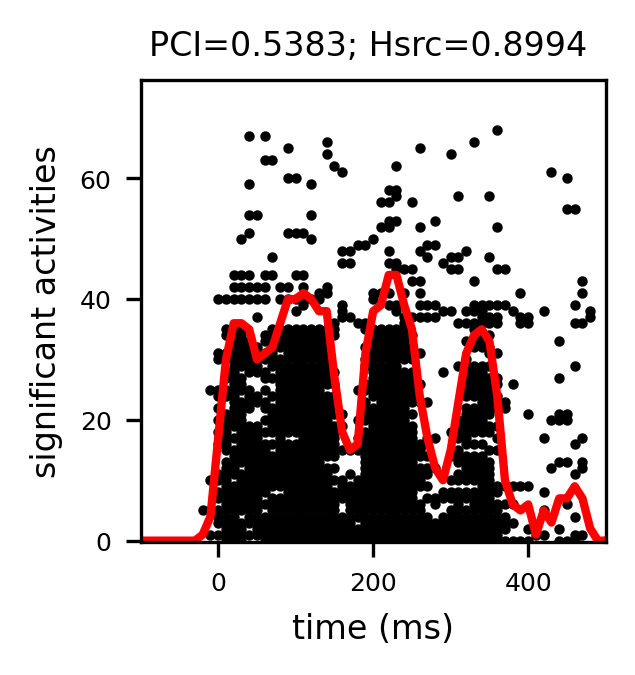

In [60]:
# Example of PCI computation in the control condition

Tmin = 0
Tmax = 500
binJ,time = load_binJ(r_c_t, nArea=76)
binJsort = pci_LZ76.sort_binJ(binJ)
plt.figure(dpi=300, figsize=(2,2))
plot_binJ(binJsort,time,lab='significant activities', ms=3, plot_sum=True)
Hsrc,PCI = pci_LZ76.computePCI(binJsort,time,tlim=[Tmin,Tmax])
plt.title('PCI=%g; Hsrc=%g '%(np.round(PCI,4), np.round(Hsrc,4)),fontsize=8);
plt.xlim(-100,500);

In all conditions (control and manipulations) each stimulus was repeated 500 times (500 trials). Then, to compare PCI values across conditions, whe formed 10 resamples of 300 trials (without repetitions) and computed PCI on each subsample. 

In [22]:
# Load the subsamples formed for each condition. 
trials_subsamples = np.load(os.path.join(path_outputs, 'trials_subsamples.npy'), allow_pickle=True).item()

In [23]:
# Labels 
conditions = ['control' if n == 0 else f'L{n}' for n in range(21)]

We now run bootstrap statistics to determine significant evoked activity. Note that the calculation is quite long and you can skip it by loading the file 'BJ_subsamples.npy' in the 'path_outputs' path.

In [24]:
'''
BJ_subsamples = {}
for stim in stimuli: 
    IFRstim = IFR_evoked[stim]
    BJ_cond = {}
    for e, cond in enumerate(conditions):
        BJ_subs = {}
        for subs in range(1,11):
            trials = trials_subsamples[stim][cond][subs]
            data = IFRstim[cond][trials].swapaxes(0,2)            
            binJ = binJproc(data, N0, alpha=0.01, boot='max', Nboot=500) 
            r,c = np.where(binJ)
            r_c_t = dict(r=r, c=c, time=t, trials=trials)
            BJ_subs.update({subs:r_c_t})
        BJ_cond.update({cond:BJ_subs})
    BJ_subsamples.update({stim:BJ_cond})
    print(stim)
'''
# load precomputed values
BJ_subsamples = np.load(os.path.join(path_outputs, 'BJ_subsamples.npy'), allow_pickle=True).item()

We calculate PCI for each subsample of each condition. Finally, the matrix with PCI values will have a shape nStim x nConditions (control + local manip) x nSubsamples (12 x 21 x 10).

In [25]:
Tmin=0
Tmax=500
Hsrc_stim, PCI_stim = [],[]
for stim in stimuli:  
    Hsrc_cond, PCI_cond = [],[]
    for c in conditions[:]:
        BinJ_list=BJ_subsamples[stim][c]
        Hsrc_subs, PCI_subs = [],[]
        for subs in range(1,11):
            what=subs
            binJ,time=load_binJ(BinJ_list[what])
            binJsort=pci_LZ76.sort_binJ(binJ)
            Hsrc,PCI=computePCI(binJsort,time,tlim=[Tmin,Tmax]) 
            Hsrc_subs.append(Hsrc)
            PCI_subs.append(PCI)
        Hsrc_cond.append(Hsrc_subs)
        PCI_cond.append(PCI_subs)  
    Hsrc_stim.append(Hsrc_cond)
    PCI_stim.append(PCI_cond)
    
Hsrc_values = np.array(Hsrc_stim)
PCI_values = np.array(PCI_stim)

# load the precomputed PCI values
#PCI_values = np.load(os.path.join(path_outputs,'PCI_values.npy'), allow_pickle=True)

## Figure 3a

For each local manipulation configuration (stimulation-manipulation pair) we compute the PCI delta, that is the difference in PCI compared to the control (PCIΔ) for a given stimulation site (e.g. stimulation of rPCi: $PCIΔ_{local\,manipulation}$ = $<PCI_{local\,manipulation}>$ - $<PCI_{ctrl}>$, where <…> indicates mean across resamples). 

In [26]:
PCI_delta_mean, Hsrc_delta_mean = [], []
PCI_delta, Hsrc_delta = [], []
PCI_delta_sem, Hsrc_delta_sem = [], []

for lm in range(21):    
    pci_lm, hsrc_lm = [], []
    for stim in range(len(stimuli)):
        pci_lm.append( (( np.array(PCI_values)[stim,lm].mean() - 
                             np.array(PCI_values)[stim, 0].mean()))) # idx 0 = control condition
        hsrc_lm.append( (( np.array(Hsrc_values)[stim,lm].mean() - 
                 np.array(Hsrc_values)[stim,0].mean())))
        
    PCI_delta.append(np.array(pci_lm))    
    PCI_delta_mean.append(np.mean(pci_lm))
    PCI_delta_sem.append(stats.sem(pci_lm))
    Hsrc_delta.append(np.array(hsrc_lm))    
    Hsrc_delta_mean.append(np.mean(hsrc_lm))
    Hsrc_delta_sem.append(stats.sem(hsrc_lm))

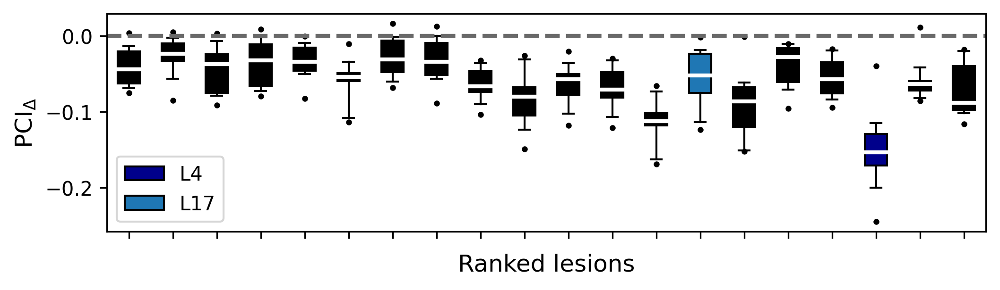

In [27]:
idxs=np.argsort(MFRdelta_all)[::-1]
fig, ax = plt.subplots(dpi=300, figsize=(8,2), facecolor='none')
box = ax.boxplot(np.array(PCI_delta).T[:,1:][:,idxs], whis=(5,95), 
           positions=np.arange(20), showfliers=True, 
           medianprops=dict(color="w", linewidth=2),
           flierprops={'marker': 'o', 'markersize': 2, 'markerfacecolor':'k',},
           patch_artist=True);

colors = ['k'] *13 + ['tab:blue'] + ['k']*3 +['darkblue'] + ['k']*2
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color);
       
ax.set_xticks(np.arange(20))
ax.set_xticklabels([]); #idxs+1
ax.axhline(0, ls='--', c='dimgray', lw=2)
ax.set_xlabel('Ranked lesions', fontsize=12)
ax.set_ylabel(r'PCI$_{\Delta}$', fontsize=12)

ax.legend([box["boxes"][np.where(idxs==4-1)[0][0]],box["boxes"][np.where(idxs==17-1)[0][0]]],
          ['L4', 'L17'], loc='best'); #-1 no control

In [28]:
pvals = stats.ttest_1samp(PCI_delta[1:], axis=1, popmean=0, alternative='less' )[1]
pvals_adj = statsmodels.stats.multitest.multipletests(pvals, method='holm')[1]
print('p-values with Bonferroni-Holm correction')
for e, cond in enumerate(conditions[1:]):
    print(cond + ':', np.around(pvals_adj[e],5))

p-values with Bonferroni-Holm correction
L1: 4e-05
L2: 0.00342
L3: 0.00342
L4: 0.0
L5: 4e-05
L6: 0.0
L7: 0.00136
L8: 9e-05
L9: 5e-05
L10: 0.00163
L11: 9e-05
L12: 0.00342
L13: 0.0
L14: 0.00342
L15: 0.00011
L16: 3e-05
L17: 0.00143
L18: 0.00141
L19: 0.00011
L20: 0.00094


### Hconn

We now calculate PCI in Hconn. Since we do not have different stimulus-local manipulation combinations here (only one stimulation was performed), we report the absolute value of PCI for each local manipulations (and the control condition).

In [29]:
BJ_Hconn = np.load(os.path.join(path_outputs,'BJHconn_subsamples.npy'), allow_pickle=True).item()

In [30]:
Hsrc_Hconn, PCI_Hconn = [],[]
for cond in range(1,22):
    sample_list={}
    for n in range(1,11):
        sample_list.update({f'sample {n}':BJ_Hconn[cond-1][f'sample {n}']})
    Hsrc_ss, PCI_ss = [],[]
    for n in range(1,11):
        what='sample {}'.format(n)
        binJ,time=load_binJ(sample_list[what],nArea=998)
        binJsort=pci_LZ76.sort_binJ(binJ)
        Hsrc,PCI=pci_LZ76.computePCI(binJsort,time,tlim=[0,600])
        Hsrc_ss.append(Hsrc)
        PCI_ss.append(PCI)
    Hsrc_Hconn.append(Hsrc_ss)
    PCI_Hconn.append(PCI_ss)

# load the precomputed values
#PCI_Hconn = list(np.load(os.path.join(path_outputs,'PCI_Hconn_values.npy'), allow_pickle=True))

(0.265, 0.495)

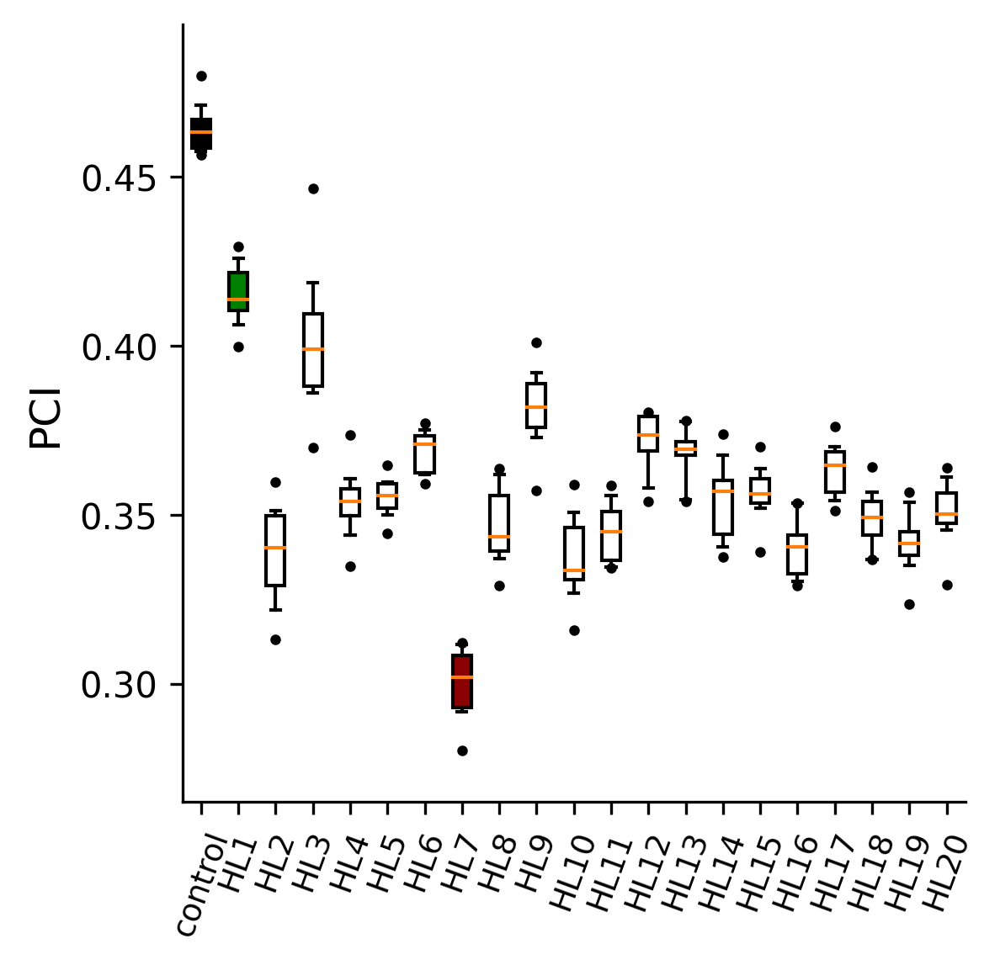

In [33]:
conditions = ['control' if n == 0 else f'HL{n}' for n in range(21)]
fig, ax = plt.subplots(dpi=300, figsize=(4,4))
box = ax.boxplot(PCI_Hconn, whis=[5,95], vert=True,
            flierprops={'marker': 'o', 'markersize': 2, 'markerfacecolor':'k',},
            medianprops=dict(color="tab:orange", linewidth=1),
            patch_artist=True);

colors = ['k'] + ['green'] + ['w']*5 + ['darkred'] + ['w']*13
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color);

plt.xticks(np.arange(1,22), labels=conditions, size=9, rotation=70)
ax.set_ylabel('PCI', fontsize=12)
ax.spines.right.set_visible(False)
ax.spines.top.set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.set_ylim(0.265, 0.495)

In [34]:
print(stats.f_oneway(PCI_Hconn[0], PCI_Hconn[1], PCI_Hconn[2], PCI_Hconn[3], PCI_Hconn[4], PCI_Hconn[5], PCI_Hconn[6], 
               PCI_Hconn[7], PCI_Hconn[8], PCI_Hconn[9], PCI_Hconn[10], PCI_Hconn[11], PCI_Hconn[12], PCI_Hconn[13], 
               PCI_Hconn[14], PCI_Hconn[15], PCI_Hconn[16], PCI_Hconn[17], PCI_Hconn[18], PCI_Hconn[19], PCI_Hconn[20]))
pvals_PCI_Hconn = sp.posthoc_ttest(PCI_Hconn, p_adjust = 'fdr_bh')

pvals_PCI_Hconn.index = [f'HL{n}' if n > 0 else 'control' for n in range(21)]
pvals_PCI_Hconn.columns = [f'HL{n}' if n > 0 else 'control' for n in range(21)]

print(f"\np-values of Dunn post-hoc test:\n{pvals_PCI_Hconn['control']}")

F_onewayResult(statistic=98.82211209376989, pvalue=9.611235838659188e-89)

p-values of Dunn post-hoc test:
control    1.000000e+00
HL1        5.276707e-10
HL2        3.126900e-14
HL3        2.514374e-07
HL4        5.311412e-15
HL5        2.103791e-16
HL6        1.113816e-15
HL7        5.674667e-17
HL8        5.446137e-15
HL9        3.602730e-12
HL10       5.446137e-15
HL11       6.939163e-16
HL12       2.460655e-14
HL13       5.311412e-15
HL14       2.581637e-14
HL15       1.113816e-15
HL16       5.434967e-16
HL17       2.060430e-15
HL18       6.939163e-16
HL19       6.939163e-16
HL20       2.060430e-15
Name: control, dtype: float64


## Figure 3b

We plot the spatiotemporal distribution of the delta instaneous firing rate (<ΔIFR>, where Δ indicates the subtraction of the mean prestimulus activity and <...> indicates the mean across trials) over the brain in the control, L4 and L17, for some representative snapshots (t=5 ms, t=145 ms, t=245 ms, t=285 ms, t=375 ms and t=485 ms)

In [35]:
%pylab nbagg
%matplotlib inline


surf = surfaces.CorticalSurface.from_file(os.path.join(path_base, 'data', 'connectivity','cortex_16384.zip'))
vtx = surf.vertices
tri = surf.triangles

regmap = region_mapping.RegionMapping.from_file().array_data
isrh_reg = Dconn.is_right_hemisphere(range(Dconn.number_of_regions))
isrh_vtx = np.array([isrh_reg[r] for r in regmap])

reg_idxs = np.arange(0, Dconn.region_labels.shape[0])

'''
    The following code is taken from: https://github.com/JohnGriffiths/ScinetSS2020_BrainNetworkModelling/tree/master
'''

from nilearn.plotting import plot_surf_roi,plot_surf_stat_map,plot_surf

from nilearn.plotting import plot_surf_roi,plot_surf_stat_map,plot_surf
from matplotlib.tri import Triangulation

def plot_surface_mpl(vtx,tri,data=None,rm=None,reorient='tvb',view='superior',
                     shaded=False,ax=None,figsize=(6,4), title=None,
                     lthr=None,uthr=None, nz_thr = 1E-20,
                     shade_kwargs = {'edgecolors': 'k', 'linewidth': 0.1,
                                     'alpha': None, 'cmap': 'coolwarm',
                                     'vmin': None, 'vmax': None}):
                        
  r"""Plot surfaces, surface patterns, and region patterns with matplotlib
    
  This is a general-use function for neuroimaging surface-based data, and 
  does not necessarily require construction of or interaction with tvb 
  datatypes. 

  See also:  plot_surface_mpl_mv



  Parameters
  ----------
  
  vtx           : N vertices x 3 array of surface vertex xyz coordinates 

  tri           : N faces x 3 array of surface faces

  data          : array of numbers to colour surface with. Can be either 
                  a pattern across surface vertices (N vertices x 1 array),
                  or a pattern across the surface's region mapping 
                  (N regions x 1 array), in which case the region mapping 
                  bust also be given as an argument. 
                  
  rm            : region mapping - N vertices x 1 array with (up to) N 
                  regions unique values; each element specifies which 
                  region the corresponding surface vertex is mapped to 

  reorient      : modify the vertex coordinate frame and/or orientation 
                  so that the same default rotations can subsequently be 
                  used for image views. The standard coordinate frame is 
                  xyz; i.e. first,second,third axis = left-right, 
                  front-back, and up-down, respectively. The standard 
                  starting orientation is axial view; i.e. looking down on
                  the brain in the x-y plane.
                  
                  Options: 

                    tvb (default)   : swaps the first 2 axes and applies a rotation
                                              
                    fs              : for the standard freesurfer (RAS) orientation; 
                                      e.g. fsaverage lh.orig. 
                                      No transformations needed for this; so is 
                                      gives same result as reorient=None

  view          : specify viewing angle. 
  
                  This can be done in one of two ways: by specifying a string 
                  corresponding to a standard viewing angle, or by providing 
                  a tuple or list of tuples detailing exact rotations to apply 
                  around each axis. 
                  
                  Standard view options are:
    
                  lh_lat / lh_med / rh_lat / rh_med / 
                  superior / inferior / posterior / anterior

                  (Note: if the surface contains both hemispheres, then medial 
                   surfaces will not be visible, so e.g. 'rh_med' will look the 
                   same as 'lh_lat')
                   
                  Arbitrary rotations can be specied by a tuple or a list of 
                  tuples, each with two elements, the first defining the axis 
                  to rotate around [0,1,2], the second specifying the angle in 
                  degrees. When a list is given the rotations are applied 
                  sequentially in the order given. 
                  
                  Example: rotations = [(0,45),(1,-45)] applies 45 degrees 
                  rotation around the first axis, followed by 45 degrees rotate 
                  around the second axis. 

  lthr/uthr     : lower/upper thresholds - set to zero any datapoints below / 
                  above these values
  
  nz_thr        : near-zero threshold - set to zero all datapoints with absolute 
                  values smaller than this number. Default is a very small 
                  number (1E-20), which unless your data has very small numbers, 
                  will only mask out actual zeros. 

  shade_kwargs  : dictionary specifiying shading options

                  Most relevant options (see matplotlib 'tripcolor' for full details):
                  
                    - 'shading'        (either 'gourand' or omit; 
                                        default is 'flat')
                    - 'edgecolors'     'k' = black is probably best
                    - 'linewidth'      0.1 works well; note that the visual 
                                       effect of this will depend on both the 
                                       surface density and the figure size 
                    - 'cmap'           colormap
                    - 'vmin'/'vmax'    scale colormap to these values
                    - 'alpha'          surface opacity
                  
  ax            : figure axis
  
  figsize       : figure size (ignore if ax provided)
  
  title         : text string to place above figure
  
  
  
                  
  Usage
  -----
       

  Basic freesurfer example:

  import nibabel as nib
  vtx,tri = nib.freesurfer.read_geometry('subjects/fsaverage/surf/lh.orig')
  plot_surface_mpl(vtx,tri,view='lh_lat',reorient='fs')



  Basic tvb example:
  
  ctx = cortex.Cortex.from_file(source_file = ctx_file,
                                region_mapping_file =rm_file)
  vtx,tri,rm = ctx.vertices,ctx.triangles,ctx.region_mapping
  conn = connectivity.Connectivity.from_file(conn_file); conn.configure()
  isrh_reg = conn.is_right_hemisphere(range(conn.number_of_regions))
  isrh_vtx = np.array([isrh_reg[r] for r in rm])
  dat = conn.tract_lengths[:,5]

  plot_surface_mpl(vtx=vtx,tri=tri,rm=rm,data=dat,view='inferior',title='inferior')

  fig, ax = plt.subplots()
  plot_surface_mpl(vtx=vtx,tri=tri,rm=rm,data=dat, view=[(0,-90),(1,55)],ax=ax,
                   title='lh angle',shade_kwargs={'shading': 'gouraud', 'cmap': 'rainbow'})

   
  """
    
  # Copy things to make sure we don't modify things 
  # in the namespace inadvertently. 
    
  vtx,tri = vtx.copy(),tri.copy()
  if data is not None: data = data.copy()

  # 1. Set the viewing angle 
  
  if reorient == 'tvb':
    # The tvb default brain has coordinates in the order 
    # yxz for some reason. So first change that:   
    vtx = np.array([vtx[:,1],vtx[:,0],vtx[:,2]]).T.copy()
    
    # Also need to reflect in the x axis
    vtx[:,0]*=-1

  # (reorient == 'fs' is same as reorient=None; so not strictly needed
  #  but is included for clarity)
   


  # ...get rotations for standard view options
    
  if   view == 'lh_lat'    : rots =  [(0,-90),(1,90)  ]
  elif view == 'lh_med'    : rots =  [(0,-90),(1,-90) ] 
  elif view == 'rh_lat'    : rots =  [(0,-90),(1,-90) ]
  elif view == 'rh_med'    : rots =  [(0,-90),(1,90)  ]
  elif view == 'superior'  : rots =   None
  elif view == 'inferior'  : rots =   (1,180)
  elif view == 'anterior'  : rots =   (0,-90)
  elif view == 'posterior' : rots =  [(0, -90),(1,180)]
  elif (type(view) == tuple) or (type(view) == list): rots = view 

  # (rh_lat is the default 'view' argument because no rotations are 
  #  for that one; so if no view is specified when the function is called, 
  #  the 'rh_lat' option is chose here and the surface is shown 'as is' 
                            
                            
  # ...apply rotations                          
     
  if rots is None: rotmat = np.eye(3)
  else:            rotmat = get_combined_rotation_matrix(rots)
  vtx = np.dot(vtx,rotmat)

                                    
      
  # 2. Sort out the data
                                    
                                    
  # ...if no data is given, plot a vector of 1s. 
  #    if using region data, create corresponding surface vector 
  if data is None: 
    data = np.ones(vtx.shape[0]) 
  elif data.shape[0] != vtx.shape[0]: 
    data = np.array([data[r] for r in rm])
    
  # ...apply thresholds
  if uthr: data *= (data < uthr)
  if lthr: data *= (data > lthr)
  data *= (np.abs(data) > nz_thr)

                                    
  # 3. Create the surface triangulation object 
  
  x,y,z = vtx.T
  tx,ty,tz = vtx[tri].mean(axis=1).T
  tr = Triangulation(x,y,tri[np.argsort(tz)])
                
  # 4. Make the figure 

  if ax is None: fig, ax = plt.subplots(figsize=figsize, dpi=300, facecolor='white')  
  
  #if shade = 'gouraud': shade_opts['shade'] = 
  tc = ax.tripcolor(tr, np.squeeze(data), **shade_kwargs)
                        
  ax.set_aspect('equal')
  ax.axis('off')
    
  if title is not None: ax.set_title(title)






def plot_surface_mpl_mv(vtx=None,tri=None,data=None,rm=None,hemi=None,   # Option 1
                        vtx_lh=None,tri_lh=None,data_lh=None,rm_lh=None, # Option 2
                        vtx_rh=None,tri_rh=None,data_rh=None,rm_rh=None,
                        title=None,**kwargs):

  r"""Convenience wrapper on plot_surface_mpl for multiple views 
   
  This function calls plot_surface_mpl five times to give a complete 
  picture of a surface- or region-based spatial pattern. 

  As with plot_surface_mpl, this function is written so as to be 
  generally usable with neuroimaging surface-based data, and does not 
  require construction of of interaction with tvb datatype objects. 

  In order for the medial surfaces to be displayed properly, it is 
  necessary to separate the left and right hemispheres. This can be 
  done in one of two ways: 

  1. Provide single arrays for vertices, faces, data, and 
     region mappings, and addition provide arrays of indices for 
     each of these (vtx_inds,tr_inds,rm_inds) with 0/False 
     indicating left hemisphere vertices/faces/regions, and 1/True 
     indicating right hemisphere. 

     Note: this requires that 

  2. Provide separate vertices,faces,data,and region mappings for 
     each hemisphere (vtx_lh,tri_lh; vtx_rh,tri_rh,etc...)


 
  Parameters
  ----------

  (see also plot_surface_mpl parameters info for more details)

  (Option 1)

  vtx               :  surface vertices
 
  tri               : surface faces

  data              : spatial pattern to plot

  rm                : surface vertex to region mapping

  hemi              : hemisphere labels for each vertex
                      (1/True = right, 0/False = left) - 
      

  OR

  (Option 2)

  vtx_lh            : left hemisphere surface_vertices
  vtx_rh            : right ``      ``    ``     ``
  
  tri_lh            : left hemisphere surface faces 
  tri_rh            : right ``      ``    ``     ``

  data_lh          : left hemisphere surface_vertices
  data_rh          : right ``      ``    ``     ``

  rm_lh            : left hemisphere region_mapping
  rm_rh            : right ``      ``    ``     ``


  title            : title to show above middle plot
 
  kwargs           : additional tripcolor kwargs; see plot_surface_mpl

 

  Examples
  ----------

  # TVB default data

  # Plot one column of the region-based tract lengths 
  # connectivity matrix. The corresponding region is 
  # right auditory cortex ('rA1')

  ctx = cortex.Cortex.from_file(source_file = ctx_file,
                                region_mapping_file =rm_file)
  vtx,tri,rm = ctx.vertices,ctx.triangles,ctx.region_mapping
  conn = connectivity.Connectivity.from_file(conn_file); conn.configure()
  isrh_reg = conn.is_right_hemisphere(range(conn.number_of_regions))
  isrh_vtx = np.array([isrh_reg[r] for r in rm])
  dat = conn.tract_lengths[:,5]

  plot_surface_mpl_mv(vtx=vtx,tri=tri,rm=rm,data=dat,
                      hemi=isrh_vtx,title=u'rA1 \ntract length')

  plot_surface_mpl_mv(vtx=vtx,tri=tri,rm=rm,data=dat,
                    hemi=isrh_vtx,title=u'rA1 \ntract length',
                    shade_kwargs = {'shading': 'gouraud',
                                    'cmap': 'rainbow'}) 


  """
   

 
  if vtx is not None:                                    # Option 1
    tri_hemi = hemi[tri].any(axis=1)
    tri_lh,tri_rh = tri[tri_hemi==0],tri[tri_hemi==1]
  elif vtx_lh is not None:                               # Option 2
    vtx = np.vstack([vtx_lh,vtx_rh])
    tri = np.vstack([tri_lh,tri_rh+tri_lh.max()+1])

  if data_lh is not None:                                # Option 2
    data = np.hstack([data_lh,data_rh])
    
  if rm_lh is not None:                                  # Option 2 
    rm = np.hstack([rm_lh,rm_rh + rm_lh.max() + 1])
    
 

  # 2. Now do the plots for each view

  # (Note: for the single hemispheres we only need lh/rh arrays for the 
  #  faces (tri); the full vertices, region mapping, and data arrays
  #  can be given as arguments, they just won't be shown if they aren't 
  #  connected by the faces in tri )
  
  # LH lateral
  plot_surface_mpl(vtx,tri_lh,data=data,rm=rm,view='lh_lat',
                   ax=subplot(2,3,1),**kwargs)
    
  # LH medial
  plot_surface_mpl(vtx,tri_lh, data=data,rm=rm,view='lh_med',
                   ax=subplot(2,3,4),**kwargs)
    
  # RH lateral
  plot_surface_mpl(vtx,tri_rh, data=data,rm=rm,view='rh_lat',
                   ax=subplot(2,3,3),**kwargs)
    
  # RH medial
  plot_surface_mpl(vtx,tri_rh, data=data,rm=rm,view='rh_med',
                   ax=subplot(2,3,6),**kwargs)
    
  # Both superior
  plot_surface_mpl(vtx,tri, data=data,rm=rm,view='superior',
                   ax=subplot(1,3,2),title=title,**kwargs)
    
  plt.subplots_adjust(left=0.0, right=1.0, bottom=0.0,
                      top=1.0, wspace=0, hspace=0) 




def get_rotation_matrix(rotation_axis, deg):
    
  '''Return rotation matrix in the x,y,or z plane'''
   
  
 
  # (note make deg minus to change from anticlockwise to clockwise rotation)
  th = -deg * (pi/180) # convert degrees to radians
    
  if rotation_axis == 0:
    return np.array( [[    1,         0,         0    ],
                      [    0,      cos(th),   -sin(th)],
                      [    0,      sin(th),    cos(th)]])
  elif rotation_axis ==1:
    return np.array( [[   cos(th),    0,        sin(th)],
                      [    0,         1,          0    ],
                      [  -sin(th),    0,        cos(th)]])
  elif rotation_axis ==2:
    return np.array([[   cos(th),  -sin(th),     0    ],
                     [    sin(th),   cos(th),     0   ],
                     [     0,         0,          1   ]])
    


def get_combined_rotation_matrix(rotations):
  '''Return a combined rotation matrix from a dictionary of rotations around 
     the x,y,or z axes'''
  rotmat = np.eye(3)
    
  if type(rotations) is tuple: rotations = [rotations] 
  for r in rotations:
    newrot = get_rotation_matrix(r[0],r[1])
    rotmat = np.dot(rotmat,newrot)
  return rotmat

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


C:\Users\gagli\Desktop\TVB_Distribution(2)\tvb_data\Lib\site-packages\IPython\core\magics\pylab.py:162: UserWarning: pylab import has clobbered these variables: ['step', 'power', 'cond', 'random', 'box', 'e', 'fft', 'time']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


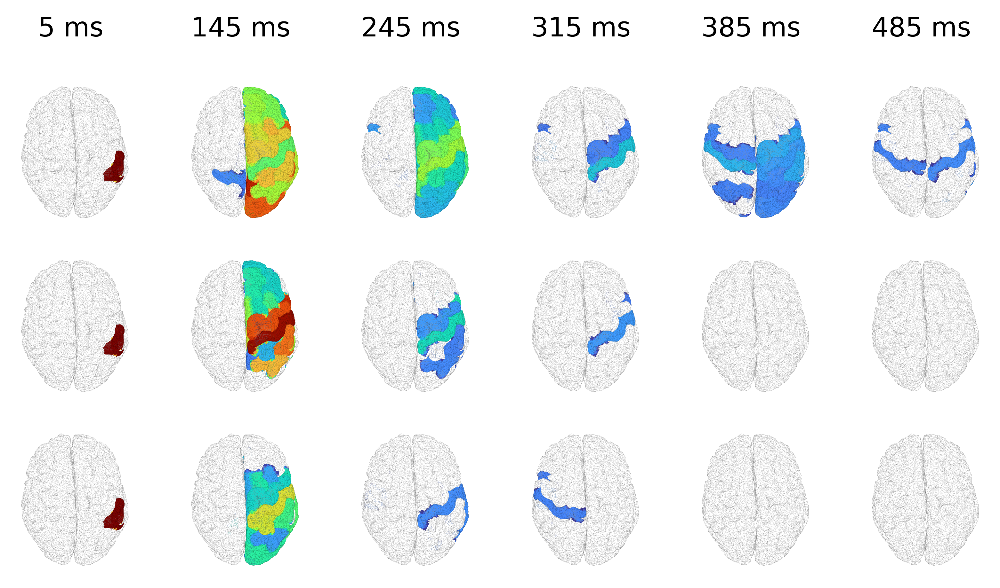

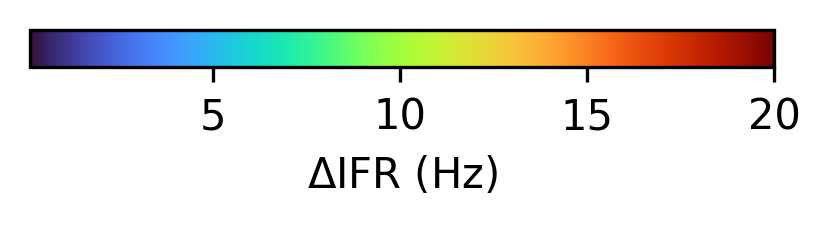

In [36]:
fig, ax = plt.subplots(ncols=6, nrows=3,figsize=(8,4),dpi=500, facecolor='white')
cmap1 = mpl.cm.get_cmap("turbo").copy() 
cmap1.set_under(color='white') 
cmap2 = mpl.cm.get_cmap("turbo").copy() 
cmap2.set_under(color='white') 

kws1 = {'edgecolors': 'k', 'vmin': 0.1, 'cmap': cmap1, 
       'vmax': 20, 'alpha': None, 'linewidth': 0.01,
       'shading': 'flat'}

kws2 = {'edgecolors': 'k', 'vmin': 0.1, 'cmap': cmap2, 
       'vmax': 20, 'alpha': None, 'linewidth': 0.01,
       'shading': 'flat'}

ts = [np.where(TimeBins==-20)[0][0],np.where(TimeBins==120)[0][0],np.where(TimeBins==220)[0][0],
      np.where(TimeBins==290)[0][0],np.where(TimeBins==360)[0][0], np.where(TimeBins==460)[0][0]]

dat1 = (np.mean(IFR_ctrl,axis=0)[:,:].T
        - np.mean(IFR_ctrl,axis=0)[:,:95].mean(axis=1)) 

dat2 = (np.mean(IFR_L4,axis=0)[:,:].T
        - np.mean(IFR_L4,axis=0)[:,:95].mean(axis=1))  

dat3 = (np.mean(IFR_L17,axis=0)[:,:].T
        - np.mean(IFR_L17,axis=0)[:,:95].mean(axis=1)) 


for t_it,t in enumerate(ts):

    plot_surface_mpl(vtx=vtx,tri=tri,data=dat1[t],rm=regmap,ax=ax[0][t_it],
                   shade_kwargs=kws1,
                   view='superior',lthr=3)
    
    plot_surface_mpl(vtx=vtx,tri=tri,data=dat2[t],rm=regmap,ax=ax[1][t_it],
                   shade_kwargs=kws2,
                   view='superior',lthr=3)
    
    plot_surface_mpl(vtx=vtx,tri=tri,data=dat3[t],rm=regmap,ax=ax[2][t_it],
               shade_kwargs=kws2,
               view='superior',lthr=3)
    
    ax[0][t_it].set_title(f'{TimeBins[t]+25} ms \n',fontsize=12)
    
plt.figure(dpi=300)

plt.imshow(dat1.T, cmap='turbo', vmin=0.1, vmax=20)
plt.gca().set_visible(False)
cb = plt.colorbar(shrink=0.5, aspect=20, orientation='horizontal')
cb.set_label(r'$\Delta$IFR (Hz)', fontsize=10)

## Figure 3c

We report the temporal courses of the <ΔIFR> (see Fig. 3b) for all nodes and separately for the representative conditions: control (grey), L4 (dark blue) and L17 (light blue). For each condition, the highest five <ΔIFR> (quantified as the total activity in the interval [0,500] ms) of the non-stimulated hemisphere (orange traces) are also reported. We also plot the sorted binary spatiotemporal matrices of significant activities.

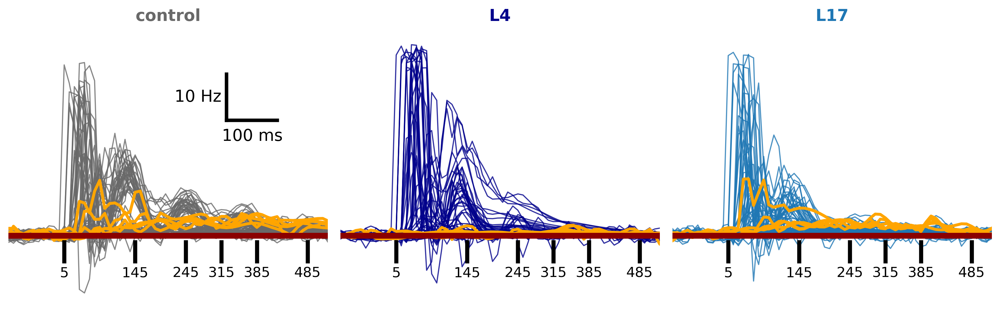

In [37]:
nodes = np.delete(np.arange(75), 37) # remove nonconnected nodes
conditions = ['control', 'L4', 'L17']
IFR_conditions = [IFR_ctrl, IFR_L4, IFR_L17]
colors=['dimgrey', 'darkblue', 'tab:blue']
lhem=[]
ts = [np.where(TimeBins==-20)[0][0],np.where(TimeBins==120)[0][0],np.where(TimeBins==220)[0][0],
      np.where(TimeBins==290)[0][0],np.where(TimeBins==360)[0][0], np.where(TimeBins==460)[0][0]]


fig = plt.figure(dpi=300, figsize=(12,4))
for i, cond in enumerate(IFR_conditions):
    ax = fig.add_subplot(1, 3, i+1)
    ax.set_title(conditions[i], fontsize=14, color=colors[i], weight='bold')
    data = np.mean(cond,axis=0)[nodes,:].T - np.mean(cond,axis=0)[nodes,:95].mean(axis=1)
    idxs = np.argsort(np.mean(data[100:160, 37:],axis=0))[::-1][:5]+37
    data_s = np.array([splev(TimeBins, splrep(TimeBins, data[:,n],s=20)) for n in range(data.shape[1])]).T #smoothing
    ax.plot(TimeBins[:], data_s[:],  c=colors[i], lw=1, alpha=0.8)
    ax.plot(TimeBins[:], data_s[:,idxs], c='orange', lw=2.5, alpha=1)
    if i==0:
        ax.plot(np.array([300,400]), np.array([25, 25]), '-k', lw=3.)
        ax.text(351, 20.5, '100 ms', ha='center', fontsize=14,weight='regular')
        ax.plot(np.array([300, 300]), np.array([25, 35]), '-k', lw=3.,)
        ax.text(290, 29, '10 Hz', ha='right', fontsize=14,weight='regular' )
    ax.set_axis_off()
    ax.set_xlim(-130,500)
    ax.set_ylim(-18,45)
    lhem.append(idxs)
    plt.axhline(data[:95,idxs].mean(axis=1).mean(), color='darkred', ls='-', lw=5)
    for t in ts:
        plt.vlines(TimeBins[t], -6, -1, color='k', ls='-', zorder=6, lw=3.5 )
        plt.text(TimeBins[t], -9, f'{TimeBins[t]+25}', ha='center', fontsize=12,weight='regular')
plt.tight_layout()

In [38]:
# BinJ (binary spatiotemporal matrices) for the stimulation of rPCI (stimuli[1]) in ctrl L4, and L17 (for a representative subsample).
BJ13 = BJ_subsamples[stimuli[1]]
BJ_ctrl = BJ13['control'][7]
BJ_L4 = BJ13['L4'][1]
BJ_L17 = BJ13['L17'][8]
BJ_list = [BJ_ctrl, BJ_L4, BJ_L17]

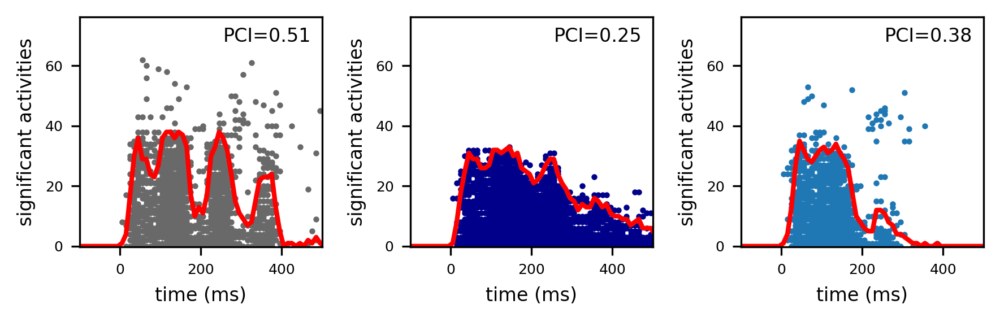

In [39]:
Tmin=0
Tmax=500
plt.figure(dpi=300, figsize=(6,2))
for i,bj in enumerate(BJ_list):
    binJ,time=load_binJ(bj)
    binJsort=pci_LZ76.sort_binJ(binJ)
    plot_binJ(binJsort,time+25,color=colors[i], ms=3, subplots=(1,3,i+1))
    Hsrc,PCI=computePCI(binJsort,time,tlim=[Tmin,Tmax]) #pci_LZ76.
    plt.text(255,68,'PCI=%g'%(np.around(PCI,2)),fontsize=8)
    plt.xlim(-100,500)
plt.tight_layout()

We report the PCI values for each combination of stimulus (rows) and local manipulation/control (columns). The conditions (control and local manipulations) are sorted in descending order according to the average PCI value computed across stimulation sites. 

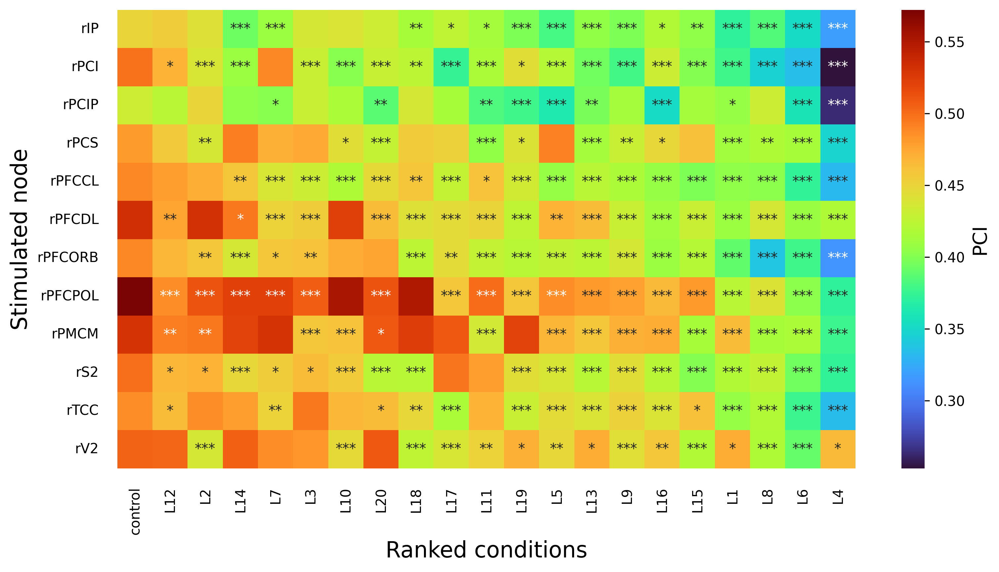

In [40]:
stim_lab = Dconn.region_labels[stimuli]
conditions = ['control' if n == 0 else f'L{n}' for n in range(21)]
data = PCI_values.mean(axis=2)
pvals = np.zeros(PCI_values.mean(axis=2).shape)
for stim in range(len(stimuli)):    
    p = sp.posthoc_ttest(PCI_values[stim], p_adjust = 'fdr_bh')
    pvals[stim,:] = np.array(p)[0]
    
sign_1 = 0.05  
sign_2 = 0.01  
sign_3 = 0.001

annot = [[f"{''}"
          + ('*' if (p < sign_1 and val != inf) else '') # change inf to put a constraint on a specific condition
          + ('*' if (p < sign_2 and val != inf) else '')  
          + ('*' if (p < sign_3 and val != inf) else '') 
          for val,p in zip(row0, row1)] for row0,row1 in zip(data,pvals)]

annot=np.array(annot)

plt.figure(dpi=300, figsize=(12,6))

idxs = np.argsort(PCI_values.mean(axis=2).mean(axis=0))[::-1]

heatmap = sns.heatmap(data[:,idxs], annot=annot[:,idxs], fmt='', cmap='turbo', 
                      annot_kws={'size': 10, 'style':'normal', 'weight':'normal'},
                      xticklabels=np.array(conditions)[idxs],
                      yticklabels=stim_lab, cbar_kws={'label': 'PCI'})

heatmap.figure.axes[-1].yaxis.label.set_size(14)
plt.tick_params(size=10, bottom=False, left=False)
plt.xlabel('Ranked conditions', size=16)
plt.ylabel('Stimulated node', size=16);

### Hconn

We do the same as Figure 3c, in Hconn. First we load the IFR of all conditions. <br> The IFR of Hconn is stored in a folder, which can be downloaded at https://unimi2013-my.sharepoint.com/:f:/g/personal/gianluca_gaglioti_unimi_it/Emts0WKNp4JPqszO8tDhCpgBl3iUNQ-OYujYLHshoKkn4g?e=htjQfi (Hconn). After downloading, the entire folder should be placed in the 'path_outputs' directory ('.../data/outputs'). 
The file is quite large; alternatively, you can load the lighter file ('Hconn_IFR_fig.npy') already present in the 'path_outputs' directory, which is necessary to plot the figure. <br> Then we plot the sorted binary spatiotemporal matrices of significant activities.

In [41]:
'''
conditions = np.array(['control' if n == 0 else f'L{n}' for n in range(21)])
Hconn_IFR={}
for cond in conditions[[0,1,7]]:
    ifr=[]
    if n!='HL10':
        for block in range(1,51):
            data = np.load(os.path.join(path_outputs,'Hconn', f'Hconn_{cond}',f'IFR25_block{block}.npy'), allow_pickle=True)
            ifr.append(data)
        ifr = np.squeeze(ifr)
        ifr = ifr.reshape(500,998,198)
    else:
        for block in np.delete(np.arange(1,51),9): # There is one block less in HL10
            data = np.load(os.path.join(path_outputs,'Hconn', f'Hconn_{cond}',f'IFR25_block{block}.npy'), allow_pickle=True)
            ifr.append(data)
        ifr = np.squeeze(ifr)
        ifr = ifr.reshape(490,998,198)
    Hconn_IFR.update({cond:ifr.mean(axis=0)}) # mean axis 0: mean across trials
'''
Hconn_IFR = np.load(os.path.join(path_outputs, 'Hconn_IFR_fig.npy'), allow_pickle=True).item()

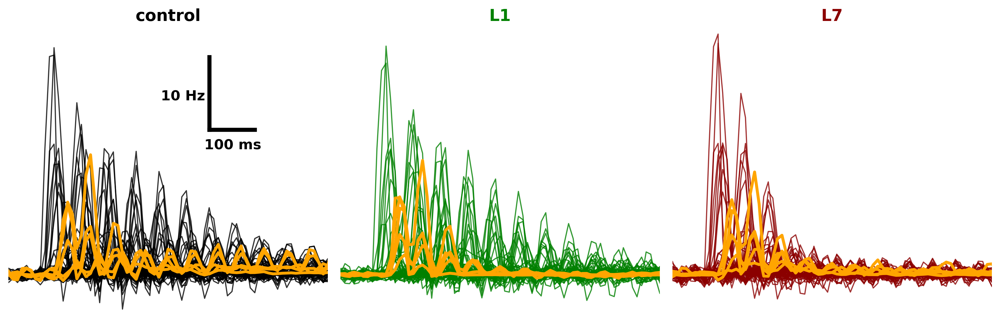

In [42]:
conditions = np.array(['control' if n == 0 else f'L{n}' for n in range(21)])
clrs=['k','green','darkred']
fig = plt.figure(dpi=300, figsize=(12,4))
for e,cond in enumerate(conditions[[0,1,7]]):  
    
    # from 998 to 66 timeseries
    lab = np.unique(Hconn.region_labels)
    ifr_66 = []
    for r in lab:
        idxs_66 = np.where(Hconn.region_labels==r)[0]
        ifr_66.append(Hconn_IFR[cond][idxs_66].mean(axis=0))
    ifr_66 = np.squeeze(ifr_66)
    
    ax = fig.add_subplot(1,3,e+1)
    ax.set_title(cond, fontsize=14, color=clrs[e], weight='bold')
    data = (ifr_66.T - ifr_66[:,:95].mean(axis=1))
    idxs = np.argsort(np.mean(data[100:150, :33],axis=0))[::-1][:5]
    ax.plot(TimeBins, data, c=clrs[e], lw=1, alpha=0.8);
    ax.plot(TimeBins, data[:,idxs], c='orange', lw=2.5, alpha=1);
    ax.set_xlim(-100,600)
    ax.set_ylim(-6,34)
    if e==0:
        ax.plot(np.array([300,400])+40, np.array([25, 25])-5, '-k', lw=3.5)
        ax.text(352+40, 22.3-5, '100 ms', ha='center', fontsize=12,weight='semibold')
        ax.plot(np.array([300, 300])+40, np.array([25, 35])-5, '-k', lw=3.5,)
        ax.text(291+40, 29-5, '10 Hz', ha='right', fontsize=12,weight='semibold' )
    ax.set_axis_off()
    
plt.tight_layout()

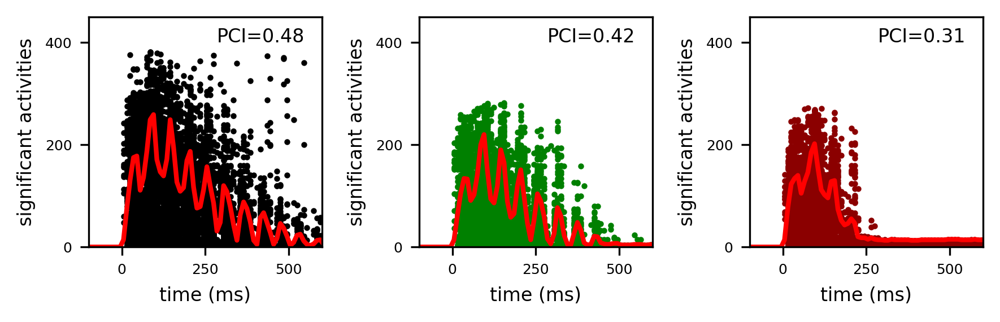

In [43]:
plt.figure(dpi=300, figsize=(6,2))
for i,cond in enumerate([0,1,7]):
    binJ,time=load_binJ(BJ_Hconn[i]['sample 6'], nArea=998)
    binJsort=pci_LZ76.sort_binJ(binJ)
    plot_binJ(binJsort,time+25,color=clrs[i], ms=3, subplots=(1,3,i+1))
    Hsrc,PCI=computePCI(binJsort,time,tlim=[0,600]) 
    plt.text(285,400,'PCI=%g'%(np.around(PCI,2)),fontsize=8)
    plt.xlim(-100,600)
    plt.ylim(0,450)
plt.tight_layout()

# Figure 4

To explore the variability of the impact of local silencing on both spontaneous and evoked metrics we investigate the contribution of individual region activity (i.e., MFR) to PCI across all conditions. Thus, for each stimulation we perform a linear regression of the PCI values (i.e., mean across resamples) versus the spontaneous mean firing rate of a node/region of interest ($MFR_{ROI}$) across all conditions (including the control condition and all local manipulations). <br> 
The IFR_evoked dictionary (see Figure 3) is required to compute $MFR_{ROI}$. Alternatively, you can load the file ("MFR_roi.npy") with pre-calculated values already present in the "path_outputs" directory.

In [44]:
# Calculate the spontaneous MFR of each ROI (MFR_roi) from the prestimulus activity.
'''
MFR_roi = np.zeros((len(stimuli),len(conditions),Dconn.number_of_regions))
pre = np.where(TimeBins<10)[0]
for s,stim in enumerate(stimuli):
    for c,cond in enumerate(conditions):
        for node in range(Dconn.number_of_regions):   
            MFR_roi[s,c,node] = IFR_evoked[stim][cond][:,node,pre].mean()
'''
# precomputed values
MFR_roi = np.load(os.path.join(path_outputs, "MFR_roi.npy"), allow_pickle=True)

In [45]:
# perform linear regressions
Rsq_mfrpci=[]
pval_mfrpci=[]
for stim in range(len(stimuli)):
    Rsq=[]
    pval=[]
    for node in range(Dconn.number_of_regions):    
        columns=[ 'MFRroi', 'PCI']
        x = np.array(MFR_roi[stim])[:,node]
        y = np.mean(PCI_values,axis=2)[stim]
        xy = np.squeeze(np.dstack( (x, y) ))
        df = pd.DataFrame(xy, columns=columns)
        model = smf.ols(formula='PCI ~ MFRroi', data=df).fit()
        Rsq.append(model.rsquared)
        pval.append(model.pvalues[1])
    Rsq_mfrpci.append(Rsq)
    pval_mfrpci.append(pval)
Rsq_mfrpci = np.squeeze(Rsq_mfrpci)
pval_mfrpci = np.squeeze(pval_mfrpci)

## Figure 4a

We plot the linear regressions for two representative ROIs (right posterior cingulate cortex; rCCp and right parahippocampal cortex; rPHC), corresponding to the ROIs showing the third highest and third lowest average correlations across stimuli, respectively. For each of the two ROIs we show two representative stimulations delivered to the inferior parietal cortex (rPCi; red boxes) and the dorsolateral prefrontal cortex (rPFCdl; green boxes).

13 rCCP 0.59 5e-05
13 rPHC 0.02 0.59411
18 rCCP 0.23 0.02677
18 rPHC 0.02 0.59211


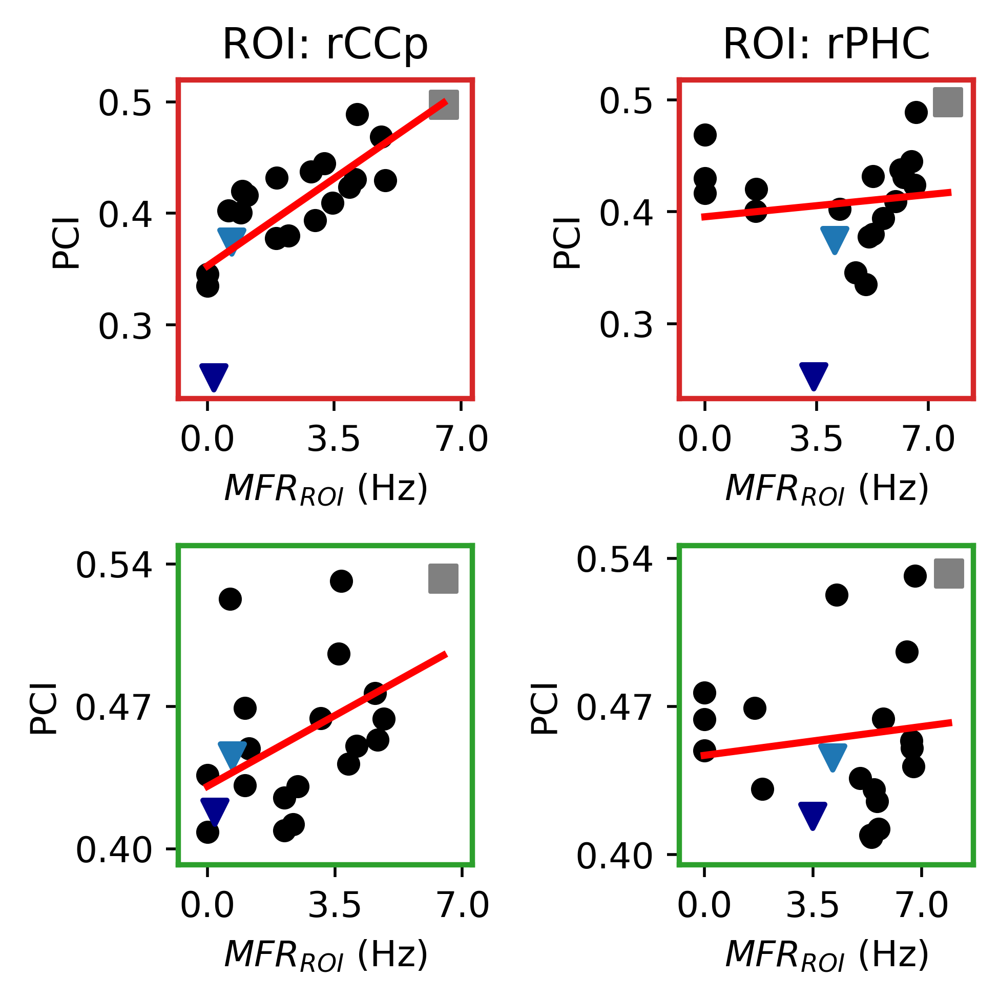

In [46]:
third_best = np.argsort(Rsq_mfrpci.mean(axis=0))[::-1][2]
third_worst = np.argsort(Rsq_mfrpci.mean(axis=0))[2]
idxs2=np.delete(np.arange(21),[0,4,17])

matplotlib.rcParams['axes.linewidth']=1.5

plt.figure(dpi=500, figsize=(4,4), facecolor='none')

stim = 1 # idx of rPCi stimulation
matplotlib.rcParams['axes.edgecolor'] = 'tab:red'
plt.subplot(221)
x = MFR_roi[stim][:, third_best]
y = np.mean(PCI_values,axis=2)[stim]
reg = lin_fit(x,y, plot_it=True, color='r')
print(stimuli[stim], Dconn.region_labels[third_best],  np.around(reg.rsquared,2), np.around(reg.f_pvalue,5))
plt.scatter(x[idxs2], y[idxs2], edgecolor='k', facecolor='k', s=25, lw=1.5)
plt.scatter(x[0], y[0], color='grey', marker='s', s=55)
plt.scatter(x[4], y[4], color='darkblue', marker='v', s=45, lw=1.5)
plt.scatter(x[17], y[17], color='tab:blue', marker='v', s=45, lw=1.5)
plt.xlabel(r'$MFR_{ROI}$ (Hz)')
plt.ylabel('PCI')
plt.xlim(x.min()-0.8,x.max()+0.8)
plt.ylim(y.min()-0.019, y.max()+0.022)
plt.xticks([0,3.5,7])
plt.title('ROI: rCCp')

stim = 1 # idx of rPCi stimulation
matplotlib.rcParams['axes.edgecolor'] = 'tab:red'
plt.subplot(222)
x = MFR_roi[stim][:, third_worst]
y = np.mean(PCI_values,axis=2)[stim]
reg = lin_fit(x,y, plot_it=True, color='r')
print(stimuli[stim], Dconn.region_labels[third_worst], np.around(reg.rsquared,2), np.around(reg.f_pvalue,5))
plt.scatter(x[idxs2], y[idxs2], edgecolor='k', facecolor='k', s=25, lw=1.5)
plt.scatter(x[0], y[0], color='grey', marker='s', s=55)
plt.scatter(x[4], y[4], color='darkblue', marker='v', s=45, lw=1.5)
plt.scatter(x[17], y[17], color='tab:blue', marker='v', s=45, lw=1.5)
plt.xlabel(r'$MFR_{ROI}$ (Hz)')
plt.ylabel('PCI')
plt.xlim(x.min()-0.8,x.max()+0.8)
plt.ylim(y.min()-0.02, y.max()+0.02)
plt.xticks([0,3.5,7])
plt.title('ROI: rPHC')

stim = 5 # idx of rPFCdl stimulation
matplotlib.rcParams['axes.edgecolor'] = 'tab:green'
plt.subplot(223)
x = MFR_roi[stim][:, third_best]
y = np.mean(PCI_values,axis=2)[stim]
reg = lin_fit(x,y, plot_it=True, color='r')
print(stimuli[stim], Dconn.region_labels[third_best],  np.around(reg.rsquared,2), np.around(reg.f_pvalue,5))
plt.scatter(x[idxs2], y[idxs2], edgecolor='k', facecolor='k', s=25, lw=1.5)
plt.scatter(x[0], y[0], color='grey', marker='s', s=55, label='ctrl')
plt.scatter(x[4], y[4], color='darkblue', marker='v', s=45, lw=1.5)
plt.scatter(x[17], y[17], color='tab:blue', marker='v', s=45, lw=1.5)
plt.xlabel(r'$MFR_{ROI}$ (Hz)')
plt.ylabel('PCI')
plt.xlim(x.min()-0.8,x.max()+0.8)
plt.ylim(y.min()-0.016, y.max()+0.016)
plt.xticks([0,3.5,7])
plt.yticks([0.4,0.47,0.54])

stim = 5 # idx of rPFCdl stimulation
matplotlib.rcParams['axes.edgecolor'] = 'tab:green'
plt.subplot(224)
x = MFR_roi[stim][:, third_worst]
y = np.mean(PCI_values,axis=2)[stim]
reg = lin_fit(x,y, plot_it=True, color='r')
print(stimuli[stim], Dconn.region_labels[third_worst],  np.around(reg.rsquared,2), np.around(reg.f_pvalue,5))
plt.scatter(x[idxs2], y[idxs2], edgecolor='k', facecolor='k', s=25, lw=1.5)
plt.scatter(x[0], y[0], color='grey', marker='s', s=55)
plt.scatter(x[4], y[4], color='darkblue', marker='v', s=45, lw=1.5)
plt.scatter(x[17], y[17], color='tab:blue', marker='v', s=45, lw=1.5)
plt.xlabel(r'$MFR_{ROI}$ (Hz)')
plt.ylabel('PCI')
plt.xlim(x.min()-0.8,x.max()+0.8)
plt.ylim(y.min()-0.013, y.max()+0.013)
plt.xticks([0,3.5,7])
plt.yticks([0.4,0.47,0.54])

plt.tight_layout()

matplotlib.rcParams['axes.linewidth']=0.8
matplotlib.rcParams['axes.edgecolor'] = 'k'

## Figure 4b

We plot the boxplot of the $R^2$ relative to the PCI versus $MFR_{ROI}$ (rCCp) and PCI versus $MFR_{ROI}$ (rPHC) linear regressions for all stimulation sites. The green and red squares refer to the regressions shown in Figure 4a.

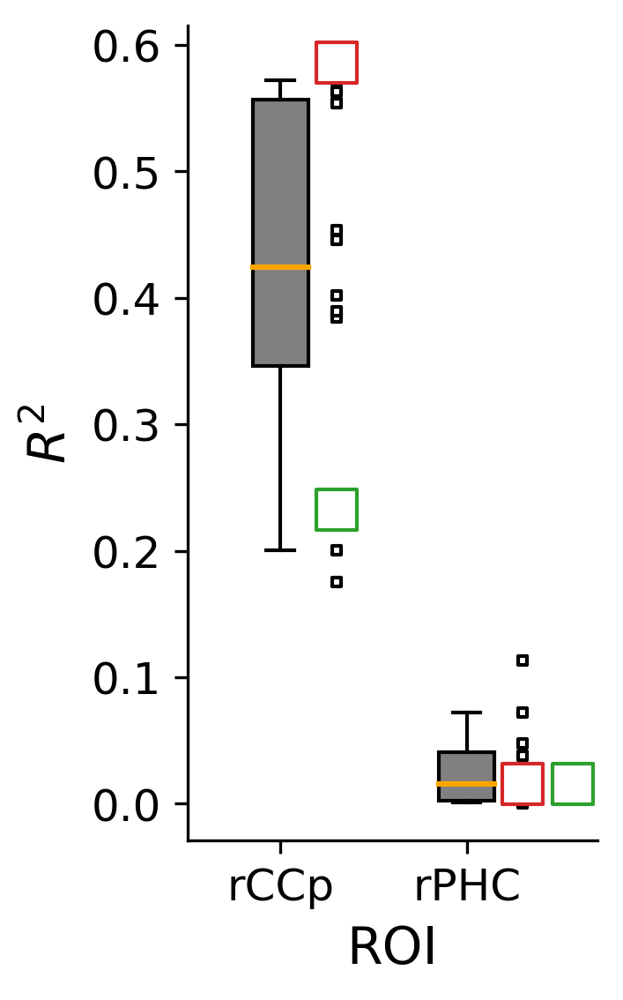

In [47]:
idxs = np.argsort(np.mean(Rsq_mfrpci,axis=0))[::-1][:]
roi1=4
roi2=24

fig, ax = plt.subplots(dpi=300, figsize=(2,4),facecolor='None')
box = ax.boxplot(x=[Rsq_mfrpci[:,roi1],Rsq_mfrpci[:,roi2]],showfliers=False,whis=(5,95), widths = 0.3,
           flierprops={'marker': 'o', 'markersize': 2, 'markerfacecolor':'k'},
                  patch_artist=True,  medianprops=dict(color="orange", linewidth=1.5))

ax.scatter(np.zeros(12) + 1.3, Rsq_mfrpci[:,roi1],
           marker='s', facecolor='white' , edgecolor='k', s=5, )
stim=1
ax.scatter(np.zeros(1) + 1.3, Rsq_mfrpci[stim,roi1],
           marker='s', facecolor='white' , edgecolor='tab:red', s=120)
stim=5
ax.scatter(np.zeros(1) +1.3, Rsq_mfrpci[stim,roi1],
           marker='s', facecolor='white' , edgecolor='tab:green', s=120)


ax.scatter(np.zeros(12) + 2.3, Rsq_mfrpci[:,roi2],
           marker='s', facecolor='white' , edgecolor='k', s=5, )
stim=1
ax.scatter(np.zeros(1) + 2.3, Rsq_mfrpci[stim,roi2],
           marker='s', facecolor='white' , edgecolor='tab:red', s=120)
stim=5
ax.scatter(np.zeros(1) + 2.57, Rsq_mfrpci[stim,roi2],
           marker='s', facecolor='white' , edgecolor='tab:green', s=120)

for patch in box['boxes']: patch.set_facecolor('gray')
    
ax.set_xticklabels(["rCCp", "rPHC"], fontsize=12)
ax.set_xlabel('ROI', fontsize=14)
ax.yaxis.set_tick_params(labelsize=12)
plt.ylabel(r'$R^2$',fontsize=14)
ax.spines.right.set_visible(False)
ax.spines.top.set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.set_xlim(0.5,2.7)

plt.show()

## Figure 4c

We plot the average brain topography across all stimulations.

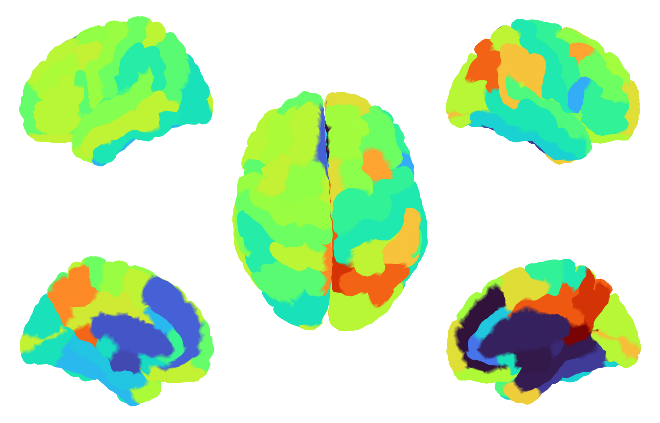

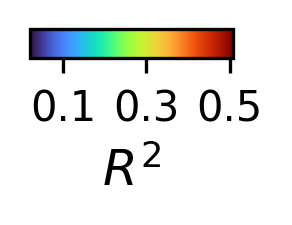

In [48]:
cmap1 = mpl.cm.get_cmap("turbo").copy()
cmap1.set_under(color='grey')

data = np.mean(Rsq_mfrpci, axis=0)

plot_surface_mpl_mv(vtx=vtx,tri=tri,rm=regmap,data=data,
                    hemi=isrh_vtx,
                    shade_kwargs = {'shading': 'gouraud',
                                'cmap': cmap1,
                                'edgecolors': 'k', 
                                'linewidth': 0, 
                                'vmin':data.min(),'vmax':data.max()})
plt.figure(dpi=300)
plt.subplot(121)
plt.imshow(np.vstack((data,data)),
            cmap='turbo', vmin=data.min(), vmax=data.max())
plt.gca().set_visible(False)

cb = plt.colorbar(shrink=0.3, aspect=7, orientation='horizontal')
cb.set_label(r'$R^2$', fontsize=12,) 
cb.set_ticks([0.1, 0.3, 0.5])

### Hconn

We do the same as Figure 4c, in Hconn.

In [49]:
Hconn_Rsq_mfrpci = np.load(os.path.join(path_outputs, 'Hconn_Rsq_mfrpci.npy'), allow_pickle=True).item()

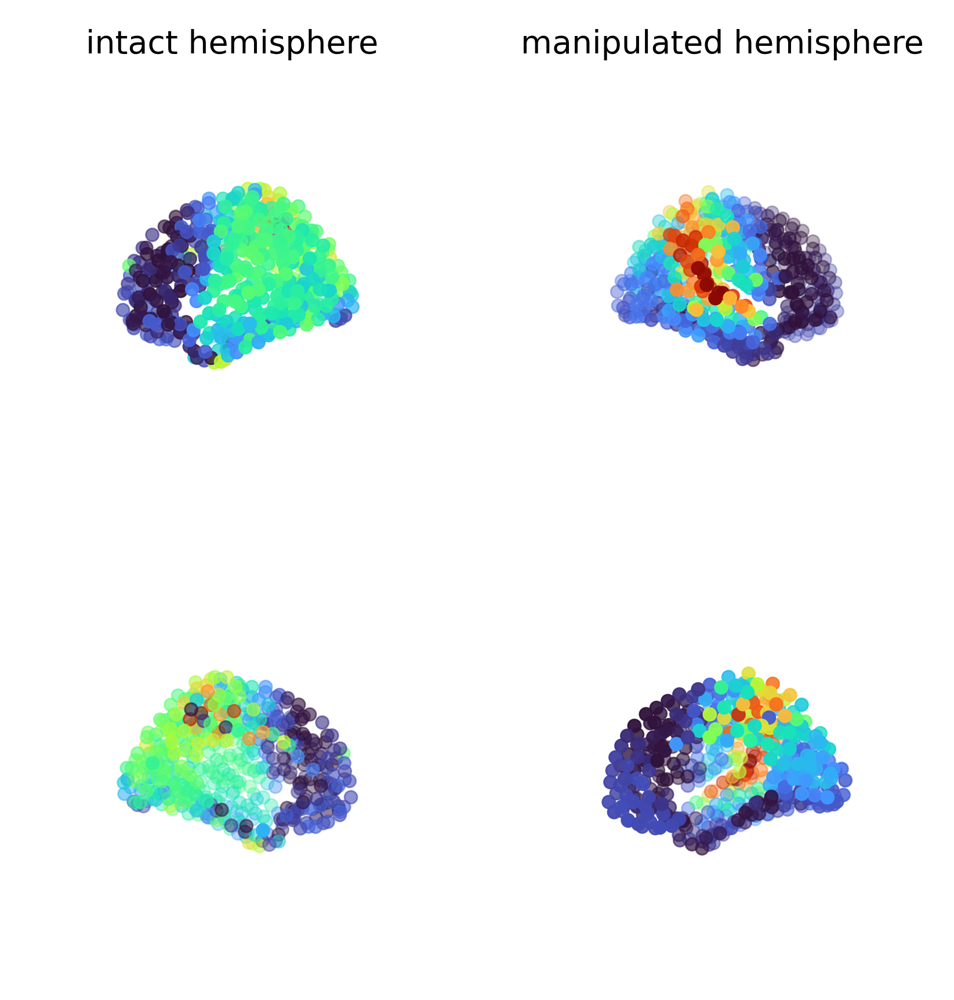

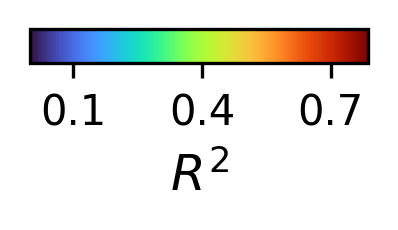

In [50]:
fig = plt.figure(dpi=500, figsize=(4,4))

x = Hconn.centres[:,0]
y = Hconn.centres[:,1]
z = Hconn.centres[:,2]           
data = Hconn_Rsq_mfrpci['Rsq']

ax = fig.add_subplot(2, 2, 1, projection='3d')
ax.set_title('intact hemisphere', fontsize=8)
sc = ax.scatter(x[500:],y[500:],z[500:],c=data[500:], cmap='turbo',zorder=6,
            linewidths=0.4, s=10, edgecolor=None)
ax.azim = 180
ax.dist = 10
ax.elev = 0
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.set_axis_off()

ax = fig.add_subplot(2, 2, 2, projection='3d')
ax.set_title('manipulated hemisphere', fontsize=8)
sc = ax.scatter(x[:500],y[:500],z[:500],c=data[:500], cmap='turbo',zorder=6,
            linewidths=0.4, s=10, edgecolor=None)
ax.azim = 0
ax.dist = 10
ax.elev = 0
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.set_axis_off()

ax = fig.add_subplot(2, 2, 3, projection='3d')                 
sc = ax.scatter(x[500:],y[500:],z[500:],c=data[500:], cmap='turbo',zorder=6,
            linewidths=0.4, s=10, edgecolor=None)
ax.azim = 0
ax.dist = 10
ax.elev = 0
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.set_axis_off()

ax = fig.add_subplot(2, 2, 4, projection='3d')                
sc = ax.scatter(x[:500],y[:500],z[:500],c=data[:500], cmap='turbo',zorder=6,
            linewidths=0.4, s=10, edgecolor=None)
ax.azim = 180
ax.dist = 10
ax.elev = 0
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.set_axis_off()

plt.figure(dpi=300)
plt.subplot(121)
plt.imshow(np.vstack((data,data)),
            cmap='turbo', vmin=data.min(), vmax=data.max())
plt.gca().set_visible(False)

cb = plt.colorbar(shrink=0.5, aspect=10, orientation='horizontal')
cb.set_label(r'$R^2$', fontsize=12,) 
cb.set_ticks([0.1, 0.4, 0.7])

## Figure 4d

Now, we perform the linear regressions for $MFR_{ROI}$ versus LZc and compute the similarity between the $R^2$ topography maps of these and the 12 $R^2$ PCI topographies for each stimulation. 

In [51]:
Rsq_mfrlzc=[]
pval=[]
for node in range(Dconn.number_of_regions):    
    columns=[ 'MFRroi', 'LZc']
    x = MFR_roi[1][:,node] # MFR_roi[1] coincides with the conditions of local manipulations explored with spontaneous LZc.
    y = np.mean(LZc_values, axis=1)
    xy = np.squeeze(np.dstack( (x,y) ))
    df = pd.DataFrame(xy, columns=columns)
    model = smf.ols(formula='LZc ~ MFRroi', data=df).fit()
    Rsq_mfrlzc.append(model.rsquared)
    pval.append(model.pvalues[1])
Rsq_mfrlzc = np.squeeze(Rsq_mfrlzc)

In [52]:
LZc_PCI, LZc_PCI_p = [], []
LZc_PCI_rhem, LZc_PCI_p_rhem = [], []
LZc_PCI_lhem, LZc_PCI_p_lhem = [], []

rhem = np.arange(37)
lhem = np.arange(38,75)

for stim in range(len(stimuli)):
    LZc_PCI.append(stats.pearsonr(Rsq_mfrlzc, Rsq_mfrpci[stim])[0])
    LZc_PCI_p.append(stats.pearsonr(Rsq_mfrlzc, Rsq_mfrpci[stim])[1])
    LZc_PCI_rhem.append(stats.pearsonr(Rsq_mfrlzc[rhem], Rsq_mfrpci[stim][rhem])[0])
    LZc_PCI_p_rhem.append(stats.pearsonr(Rsq_mfrlzc[rhem], Rsq_mfrpci[stim][rhem])[1])
    LZc_PCI_lhem.append(stats.pearsonr(Rsq_mfrlzc[lhem], Rsq_mfrpci[stim][lhem])[0])
    LZc_PCI_p_lhem.append(stats.pearsonr(Rsq_mfrlzc[lhem], Rsq_mfrpci[stim][lhem])[1])

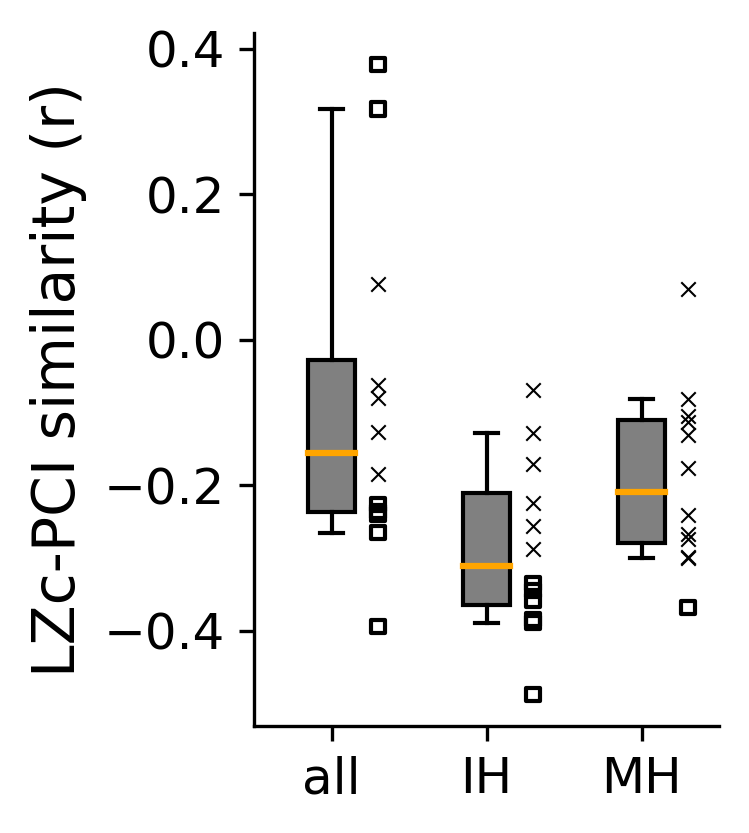

In [53]:
fig, ax = plt.subplots(dpi=300, figsize=(2,3),facecolor='None')

box = ax.boxplot(x=np.array([LZc_PCI, LZc_PCI_lhem,LZc_PCI_rhem]).T,showfliers=False,whis=(5,95), widths = 0.3,
           flierprops={'marker': 'o', 'markersize': 2, 'markerfacecolor':'k'},
                  patch_artist=True, medianprops=dict(color="orange", linewidth=1.5))

for stim in range(len(stimuli)):
    if LZc_PCI_p[stim]<0.05:
        ax.scatter(1+0.3, np.array(LZc_PCI)[stim], 
               facecolor='None', marker='s',  edgecolor='k', s=10, lw=1, ls='-')
    else:
        ax.scatter(1+0.3, np.array(LZc_PCI)[stim], 
                   marker='x',  color='k', s=12, lw=0.5, ls='-')    
    if LZc_PCI_p_lhem[stim]<0.05:
        ax.scatter(2+0.3, np.array(LZc_PCI_lhem)[stim], 
                   facecolor='None', marker='s',  edgecolor='k', s=10, lw=1, ls='-')
    else:
        ax.scatter(2+0.3, np.array(LZc_PCI_lhem)[stim], 
                   marker='x',  color='k', s=12, lw=0.5, ls='-')   
    if LZc_PCI_p_rhem[stim]<0.05:
        ax.scatter(3+0.3, np.array(LZc_PCI_rhem)[stim], 
                   facecolor='None', marker='s',  edgecolor='k', s=10, lw=1, ls='-')
    else:
        ax.scatter(3+0.3, np.array(LZc_PCI_rhem)[stim], 
                   marker='x',  color='k', s=12, lw=0.5, ls='-')
        
for patch in box['boxes']: patch.set_facecolor('gray')
xticks=np.arange(1,4,step=1)
plt.xticks(xticks, labels=['all']+['IH']+['MH'], fontsize=12)
plt.ylabel(r'LZc-PCI similarity (r)',fontsize=14)
ax.spines.right.set_visible(False)
ax.spines.top.set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
matplotlib.rcParams['axes.edgecolor'] = 'k'
ax.yaxis.set_tick_params(labelsize=12)

plt.show()

# Figure 5

Here, we explore the relationship between the $R^2$-topographies derived from spontaneous (LZc) as well as perturbational complexity (PCI) measures and basic graph properties. To this aim we correlate the weighted degree (WD) of each node (an index of network centrality calculated both on SC and FC), with the corresponding values of the complexity-$R^2$ topographies.

## Figure 5a

r: 0.3426637709741034, p-value: 0.002444985042550995


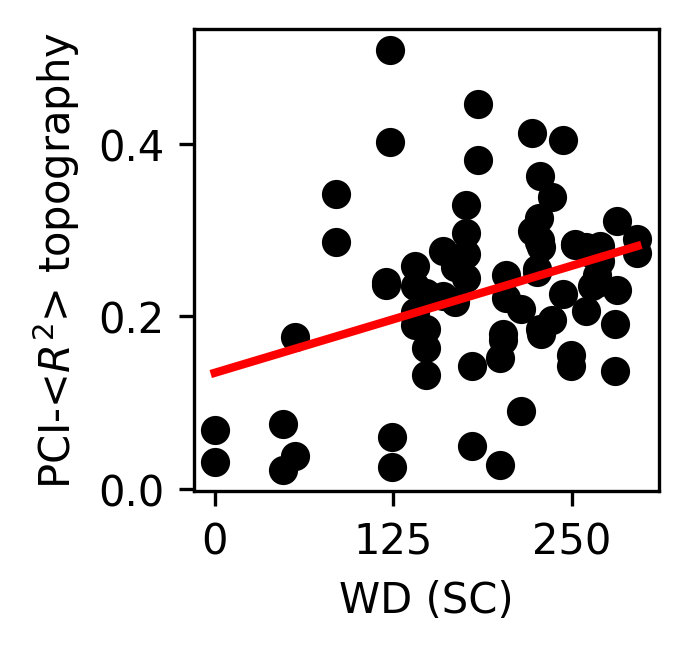

In [54]:
Gsc = nx.from_numpy_array(Dconn.weights*4, create_using=nx.Graph)
dw = np.array(list(dict(nx.degree(Gsc,weight='weight')).values())) 
x, y = dw, np.mean(Rsq_mfrpci, axis=0)
r,p = stats.pearsonr(x,y)
lab = 'PCI-<$R^2$>'

plt.figure(dpi=300, figsize=(2,2), facecolor='None')
plt.scatter(x,y, c='k', cmap='turbo', vmin=0., vmax=y.max()) #c=y
reg = lin_fit(x,y, color='r', plot_it=True )
plt.ylabel(f'{lab} topography')
plt.xlabel(r'WD (SC)')
plt.xticks([0,125,250])
print(f'r: {r}, p-value: {p}')

## Figure 5b

r: 0.2157542265472588, p-value: 0.06122868488600022


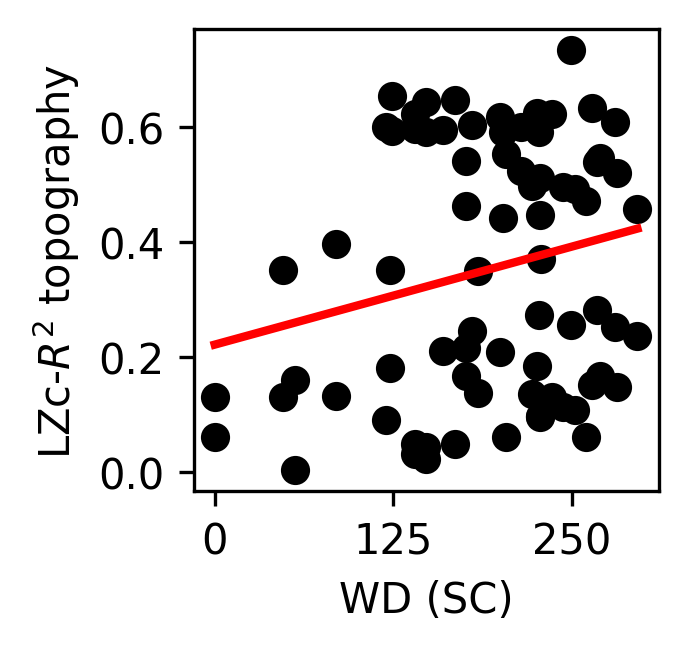

In [55]:
Gsc = nx.from_numpy_array(Dconn.weights*4, create_using=nx.Graph)
dw = np.array(list(dict(nx.degree(Gsc,weight='weight')).values())) 
x, y = dw, Rsq_mfrlzc
r,p = stats.pearsonr(x,y)
lab='LZc-$R^2$'

plt.figure(dpi=300, figsize=(2,2), facecolor='None')
plt.scatter(x,y, c='k', cmap='turbo', vmin=0., vmax=y.max()) #c=y
reg = lin_fit(x,y, color='r', plot_it=True )
plt.ylabel(f'{lab} topography')
plt.xlabel(r'WD (SC)')
plt.xticks([0,125,250])
print(f'r: {r}, p-value: {p}')

## Figure 5c

In [56]:
#fc = np.corrcoef(IFR_spontaneous['control'])

# load precomputed fc
fc = np.load(os.path.join(path_outputs, 'FC_control.npy'), allow_pickle=True)

r: 0.592297646969595, p-value: 1.741412222679875e-08


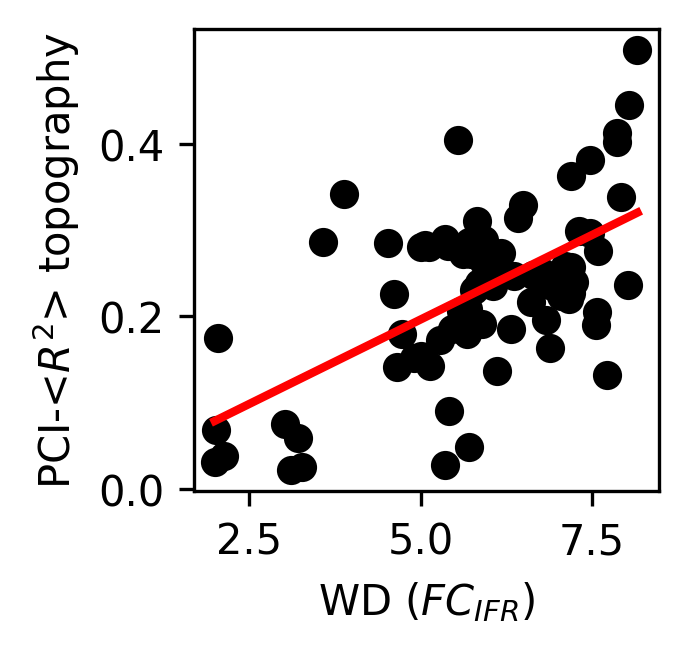

In [57]:
Gfc = nx.from_numpy_array(fc)
dw = np.array(list(dict(nx.degree(Gfc,weight='weight')).values())) 
lab='PCI-<$R^2$>'
x, y = dw, np.mean(Rsq_mfrpci, axis=0)
r,p = stats.pearsonr(x,y)

plt.figure(dpi=300, figsize=(2,2), facecolor='None')
plt.scatter(x,y, c='k', cmap='turbo', vmin=0., vmax=y.max())
reg = lin_fit(x,y, color='r', plot_it=True )
plt.ylabel(f'{lab} topography')
plt.xlabel(r'WD $(FC_{IFR})$')
print(f'r: {r}, p-value: {p}')

## Figure 5d

r: -0.0772638137188692, p-value: 0.5070745293253701


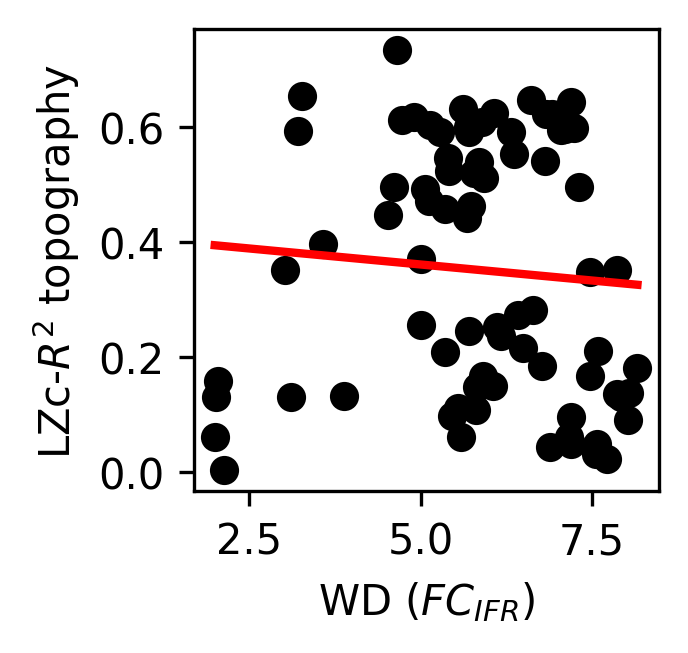

In [58]:
Gfc = nx.from_numpy_array(fc)
dw = np.array(list(dict(nx.degree(Gfc,weight='weight')).values())) 
x, y = dw, Rsq_mfrlzc
r,p = stats.pearsonr(x,y)
lab = 'LZc-$R^2$'

plt.figure(dpi=300, figsize=(2,2), facecolor='None')
plt.scatter(x,y, c='k', cmap='turbo', vmin=0., vmax=y.max())
reg = lin_fit(x,y, color='r', plot_it=True )
plt.ylabel(f'{lab} topography')
plt.xlabel(r'WD $(FC_{IFR})$')
print(f'r: {r}, p-value: {p}')

### Hconn

r: 0.4443163032921225, p-value: 1.546187058849955e-49


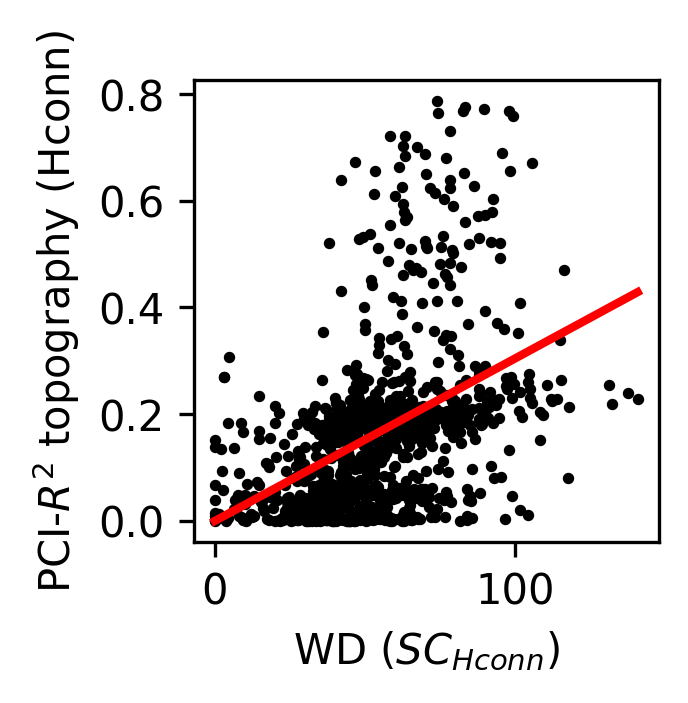

In [59]:
Gsc = nx.from_numpy_matrix(Hconn.weights*3) # 3: Global coupling
dw = np.array(list(dict(nx.degree(Gsc,weight='weight')).values())) 

x, y = dw, Hconn_Rsq_mfrpci['Rsq']
r,p = stats.pearsonr(x,y)

plt.figure(dpi=300, figsize=(2,2), facecolor='None')
plt.scatter(x,y, c='k', s=3, cmap='turbo', vmin=0., vmax=y.max())
reg = lin_fit(x,y, color='r', plot_it=True )
plt.ylabel(r'PCI-$R^2$ topography (Hconn)')
plt.xlabel(r'WD ($SC_{Hconn}$)')
print(f'r: {r}, p-value: {p}')